## Network Intrusion Detection System 
### Multinomial classification: Activity is normal or DOS or PROBE or R2L or U2R


<b>Method Description</b>

<b>Step 1:</b> Data preprocessing:
All features are made numerical using one-Hot-encoding. The features are scaled to avoid features with large values that may weigh too much in the results.

<b>Step 2:</b> Feature Selection:
Eliminate redundant and irrelevant data by selecting a subset of relevant features that fully represents the given problem. Univariate feature selection with <b>RFE & Seleck K Best </b>. This analyzes each feature individually to detemine the strength of the relationship between the feature and labels. Using <b> Weight of Evidence & VIF</b> method  to select features based on  highest scores.

<b>Step 4:</b> Build the model:
Decision tree model is built.

<b>Step 5:</b> Prediction & Evaluation (validation):
Using the combined Test and Train data to make predictions of the model. Multiple scores are considered such as:accuracy score, recall, f-measure, confusion matrix using <b>XGBoost,Adaptive Boosting ,Random Forest & Logistic Regression Models</b>

In [5]:
#Packages related to general operating system & warnings
import os 
import warnings
warnings.filterwarnings('ignore')

#Packages related to data importing, manipulation, exploratory data analysis, data understanding
import numpy as np
import pandas as pd
from pandas import Series, DataFrame
import pandas_profiling
import scipy.stats as stats

#Packages related to data visualizaiton
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

#Setting plot sizes and type of plot
plt.rc("font", size=14)
plt.rcParams['axes.grid'] = True
plt.figure(figsize=(6,3))
plt.gray()

from matplotlib.backends.backend_pdf import PdfPages

#Modules related to split the data & gridsearch
from sklearn.model_selection import train_test_split, GridSearchCV

#Module related to calculation of metrics
from sklearn import metrics

#Module related to VIF 
from statsmodels.stats.outliers_influence import variance_inflation_factor

#Modules related to preprocessing (Imputation of missings, standardiszation, new features creation, converting categorical to numerical)
from sklearn.impute import MissingIndicator, SimpleImputer
from sklearn.preprocessing import  PolynomialFeatures, KBinsDiscretizer, FunctionTransformer
from sklearn.preprocessing import StandardScaler, MinMaxScaler, MaxAbsScaler
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, LabelBinarizer, OrdinalEncoder

#Moudles related to feature selection
from sklearn.feature_selection import RFE, RFECV, SelectKBest, chi2, SelectPercentile, f_classif, mutual_info_classif, f_regression, VarianceThreshold, SelectFromModel, mutual_info_classif, mutual_info_regression, SelectFpr, SelectFdr, SelectFwe


#Modules related to pipe line creation for faster processing
from sklearn.pipeline import Pipeline
from sklearn.pipeline import FeatureUnion
#from sklearn.features.transformers import DataFrameSelector

#Modules related to saving python objects permanantly
from sklearn.externals import joblib

#Dumping model into current directory: joblib.dump(model_xg,"my_model.pkl") 
#Loading model: my_model_loaded=joblib.load("my_model.pkl")

#Modules related key techniques of supervised learning 
import statsmodels.formula.api as smf
import statsmodels.tsa as tsa

from sklearn.linear_model import LogisticRegression, LinearRegression, ElasticNet, Lasso, Ridge
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor, export_graphviz, export
from sklearn.ensemble import BaggingClassifier, BaggingRegressor,RandomForestClassifier,RandomForestRegressor
from sklearn.ensemble import GradientBoostingClassifier,GradientBoostingRegressor, AdaBoostClassifier, AdaBoostRegressor 
#from xgboost import XGBClassifier, XGBRegressor
from sklearn.naive_bayes import BernoulliNB, MultinomialNB, GaussianNB
from sklearn.svm import LinearSVC, LinearSVR, SVC, SVR
from sklearn.neural_network import MLPClassifier, MLPRegressor

<Figure size 432x216 with 0 Axes>

#### Load Test and Train data

In [6]:
# attach the column names to the dataset
col_names = ["duration","protocol_type","service","flag","src_bytes",
    "dst_bytes","land","wrong_fragment","urgent","hot","num_failed_logins",
    "logged_in","num_compromised","root_shell","su_attempted","num_root",
    "num_file_creations","num_shells","num_access_files","num_outbound_cmds",
    "is_host_login","is_guest_login","count","srv_count","serror_rate",
    "srv_serror_rate","rerror_rate","srv_rerror_rate","same_srv_rate",
    "diff_srv_rate","srv_diff_host_rate","dst_host_count","dst_host_srv_count",
    "dst_host_same_srv_rate","dst_host_diff_srv_rate","dst_host_same_src_port_rate",
    "dst_host_srv_diff_host_rate","dst_host_serror_rate","dst_host_srv_serror_rate",
    "dst_host_rerror_rate","dst_host_srv_rerror_rate","label"]

# KDDTrain+_2.csv & KDDTest+_2.csv are the datafiles without the last column about the difficulty score
# these have already been removed.
Train_Data = pd.read_csv("H:/Machine Learning/6. Machine Learning- Final Projects Submission/1. Supervised Learning(Regression,Classification,Forecasting)/3. Network Intrusion Detection System/NSL_Dataset/Train_Data.csv", header=None, names = col_names)
Test_Data = pd.read_csv("H:/Machine Learning/6. Machine Learning- Final Projects Submission/1. Supervised Learning(Regression,Classification,Forecasting)/3. Network Intrusion Detection System/NSL_Dataset/Test_Data.csv", header=None, names = col_names)

# shape, this gives the dimensions of the dataset
print('Dimensions of the Training set:',Train_Data.shape)
print('Dimensions of the Test set:',Test_Data.shape)

Dimensions of the Training set: (125973, 42)
Dimensions of the Test set: (22544, 42)


### Data Audit

In [7]:
Train_Data.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,label
0,0,tcp,ftp_data,SF,491,0,0,0,0,0,...,25,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,normal
1,0,udp,other,SF,146,0,0,0,0,0,...,1,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,normal
2,0,tcp,private,S0,0,0,0,0,0,0,...,26,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune
3,0,tcp,http,SF,232,8153,0,0,0,0,...,255,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,normal
4,0,tcp,http,SF,199,420,0,0,0,0,...,255,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,normal


In [8]:
Test_Data.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,label
0,0,tcp,private,REJ,0,0,0,0,0,0,...,10,0.04,0.06,0.00,0.00,0.0,0.0,1.00,1.00,neptune
1,0,tcp,private,REJ,0,0,0,0,0,0,...,1,0.00,0.06,0.00,0.00,0.0,0.0,1.00,1.00,neptune
2,2,tcp,ftp_data,SF,12983,0,0,0,0,0,...,86,0.61,0.04,0.61,0.02,0.0,0.0,0.00,0.00,normal
3,0,icmp,eco_i,SF,20,0,0,0,0,0,...,57,1.00,0.00,1.00,0.28,0.0,0.0,0.00,0.00,saint
4,1,tcp,telnet,RSTO,0,15,0,0,0,0,...,86,0.31,0.17,0.03,0.02,0.0,0.0,0.83,0.71,mscan


In [9]:
Train_Data.describe()

,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,...,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate
count,125973.00000,1.259730e+05,1.259730e+05,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,...,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000
mean,287.14465,4.556674e+04,1.977911e+04,0.000198,0.022687,0.000111,0.204409,0.001222,0.395736,0.279250,...,182.148945,115.653005,0.521242,0.082951,0.148379,0.032542,0.284452,0.278485,0.118832,0.120240
std,2604.51531,5.870331e+06,4.021269e+06,0.014086,0.253530,0.014366,2.149968,0.045239,0.489010,23.942042,...,99.206213,110.702741,0.448949,0.188922,0.308997,0.112564,0.444784,0.445669,0.306557,0.319459
min,0.00000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.00000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,82.000000,10.000000,0.050000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.00000,4.400000e+01,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,255.000000,63.000000,0.510000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.00000,2.760000e+02,5.160000e+02,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,255.000000,255.000000,1.000000,0.070000,0.060000,0.020000,1.000000,1.000000,0.000000,0.000000
max,42908.00000,1.379964e+09,1.309937e+09,1.000000,3.000000,3.000000,77.000000,5.000000,1.000000,7479.000000,...,255.000000,255.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [10]:
Test_Data.describe()

,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,...,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate
count,22544.000000,2.254400e+04,2.254400e+04,22544.000000,22544.000000,22544.000000,22544.000000,22544.000000,22544.000000,22544.000000,...,22544.000000,22544.000000,22544.000000,22544.000000,22544.000000,22544.000000,22544.000000,22544.000000,22544.000000,22544.000000
mean,218.859076,1.039545e+04,2.056019e+03,0.000311,0.008428,0.000710,0.105394,0.021647,0.442202,0.119899,...,193.869411,140.750532,0.608722,0.090540,0.132261,0.019638,0.097814,0.099426,0.233385,0.226683
std,1407.176612,4.727864e+05,2.121930e+04,0.017619,0.142599,0.036473,0.928428,0.150328,0.496659,7.269597,...,94.035663,111.783972,0.435688,0.220717,0.306268,0.085394,0.273139,0.281866,0.387229,0.400875
min,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,121.000000,15.000000,0.070000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,5.400000e+01,4.600000e+01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,255.000000,168.000000,0.920000,0.010000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,2.870000e+02,6.010000e+02,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,255.000000,255.000000,1.000000,0.060000,0.030000,0.010000,0.000000,0.000000,0.360000,0.170000
max,57715.000000,6.282565e+07,1.345927e+06,1.000000,3.000000,3.000000,101.000000,4.000000,1.000000,796.000000,...,255.000000,255.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [11]:
#Checking Missing Values for Train and Test Data

print(sum(Train_Data.isnull().sum()))
print(sum(Test_Data.isnull().sum()))

0
0


#### Label Distribution of Train and Test Data

In [12]:
print('Label distribution Training set:')
print(Train_Data.label.value_counts())

Label distribution Training set:
normal             67343
neptune            41214
satan               3633
ipsweep             3599
portsweep           2931
smurf               2646
nmap                1493
back                 956
teardrop             892
warezclient          890
pod                  201
guess_passwd          53
buffer_overflow       30
warezmaster           20
land                  18
imap                  11
rootkit               10
loadmodule             9
ftp_write              8
multihop               7
phf                    4
perl                   3
spy                    2
Name: label, dtype: int64


In [13]:
print('Label distribution Test set:')
print(Test_Data.label.value_counts())

Label distribution Test set:
normal             9711
neptune            4657
guess_passwd       1231
mscan               996
warezmaster         944
apache2             737
satan               735
processtable        685
smurf               665
back                359
snmpguess           331
saint               319
mailbomb            293
snmpgetattack       178
portsweep           157
ipsweep             141
httptunnel          133
nmap                 73
pod                  41
buffer_overflow      20
multihop             18
named                17
ps                   15
sendmail             14
xterm                13
rootkit              13
teardrop             12
xlock                 9
land                  7
xsnoop                4
ftp_write             3
sqlattack             2
udpstorm              2
worm                  2
loadmodule            2
phf                   2
perl                  2
imap                  1
Name: label, dtype: int64


### Data Pre-Processing

#### 1. Generate Profile Report for Train and Test Data

In [14]:
##Train Data

profile_report = pandas_profiling.ProfileReport(Train_Data)
profile_report

Number of variables,42
Number of observations,125973
Total Missing (%),0.0%
Total size in memory,40.4 MiB
Average record size in memory,336.0 B
Numeric,25
Categorical,4
Boolean,5
Date,0
Text (Unique),0
Rejected,8


In [15]:
#Test Data Profile Report

profile_report = pandas_profiling.ProfileReport(Test_Data)
profile_report

Number of variables,42
Number of observations,22544
Total Missing (%),0.0%
Total size in memory,7.2 MiB
Average record size in memory,336.0 B
Numeric,25
Categorical,4
Boolean,5
Date,0
Text (Unique),0
Rejected,8


### Dropping columns based on Profile Report

In [16]:
Train_Data = Train_Data.drop(columns=['num_compromised','srv_serror_rate','srv_rerror_rate','dst_host_srv_serror_rate','dst_host_srv_rerror_rate'])
Test_Data = Test_Data.drop(columns=['num_compromised','srv_serror_rate','srv_rerror_rate','dst_host_srv_serror_rate','dst_host_srv_rerror_rate'])

### 1. Data Prepcocessing

#### (a) Identify Categorical Fetaures

In [17]:
print('Train Data set:')

for col_name in Train_Data.columns:
    if Train_Data[col_name].dtypes == 'object' :
        unique_cat = len(Train_Data[col_name].unique())
        print("Feature :'{col_name}' has {unique_cat} categories".format(col_name=col_name, unique_cat=unique_cat))

#see how distributed the feature service is, it is evenly distributed and therefore we need to make dummies for all.
print()
print('Distribution of categories in service:')
print(Train_Data['service'].value_counts().sort_values(ascending=False).head())

Train Data set:
Feature :'protocol_type' has 3 categories
Feature :'service' has 70 categories
Feature :'flag' has 11 categories
Feature :'label' has 23 categories

Distribution of categories in service:
http        40338
private     21853
domain_u     9043
smtp         7313
ftp_data     6860
Name: service, dtype: int64


In [18]:
print('Test Data set:')

for col_name in Test_Data.columns:
    if Test_Data[col_name].dtypes == 'object' :
        unique_cat = len(Test_Data[col_name].unique())
        print("Feature :'{col_name}' has {unique_cat} categories".format(col_name=col_name, unique_cat=unique_cat))

#see how distributed the feature service is, it is evenly distributed and therefore we need to make dummies for all.
print()
print('Distribution of categories in service:')
print(Test_Data['service'].value_counts().sort_values(ascending=False).head())

Test Data set:
Feature :'protocol_type' has 3 categories
Feature :'service' has 64 categories
Feature :'flag' has 11 categories
Feature :'label' has 38 categories

Distribution of categories in service:
http       7853
private    4774
telnet     1626
pop_3      1019
smtp        934
Name: service, dtype: int64


### <b>Observation</b>

1. <b> Service Categories in Train Data has 6 less than Test Data - Hence we need to add those</b>
2. <b> LabelCategories in Train Data has 15 less than Test Data - Hence we need to add those</b>

### Label Encoding of Categorical Values

In [19]:
Categorical_Columns = ['protocol_type', 'service', 'flag']

Train_Categorical_Var = Train_Data[Categorical_Columns]
Test_Categorical_Var = Test_Data[Categorical_Columns]

In [20]:
Train_Categorical_Var.head()

,protocol_type,service,flag
0,tcp,ftp_data,SF
1,udp,other,SF
2,tcp,private,S0
3,tcp,http,SF
4,tcp,http,SF


#### Columns Name for Dummies

In [21]:
##Train Data Set

# protocol type
unique_protocol = sorted(Train_Data.protocol_type.unique())
unique_protocol_train=['Protocol_type_' + x for x in unique_protocol]

# service
unique_service = sorted(Train_Data.service.unique())
unique_service_train = ['service_' + x for x in unique_service]

# flag
unique_flag = sorted(Train_Data.flag.unique())
unique_flag_train = ['flag_' + x for x in unique_flag]

# put together
Train_Dum_Columns = unique_protocol_train + unique_service_train + unique_flag_train
print(Train_Dum_Columns)


['Protocol_type_icmp', 'Protocol_type_tcp', 'Protocol_type_udp', 'service_IRC', 'service_X11', 'service_Z39_50', 'service_aol', 'service_auth', 'service_bgp', 'service_courier', 'service_csnet_ns', 'service_ctf', 'service_daytime', 'service_discard', 'service_domain', 'service_domain_u', 'service_echo', 'service_eco_i', 'service_ecr_i', 'service_efs', 'service_exec', 'service_finger', 'service_ftp', 'service_ftp_data', 'service_gopher', 'service_harvest', 'service_hostnames', 'service_http', 'service_http_2784', 'service_http_443', 'service_http_8001', 'service_imap4', 'service_iso_tsap', 'service_klogin', 'service_kshell', 'service_ldap', 'service_link', 'service_login', 'service_mtp', 'service_name', 'service_netbios_dgm', 'service_netbios_ns', 'service_netbios_ssn', 'service_netstat', 'service_nnsp', 'service_nntp', 'service_ntp_u', 'service_other', 'service_pm_dump', 'service_pop_2', 'service_pop_3', 'service_printer', 'service_private', 'service_red_i', 'service_remote_job', 'serv

In [22]:
#Test Data Set

# service
unique_service_test = sorted(Test_Data.service.unique())
unique_service_test_col = ['service_' + x for x in unique_service_test]


Test_Dum_Columns = unique_protocol_train + unique_service_test_col + unique_flag_train
print(Test_Dum_Columns)

['Protocol_type_icmp', 'Protocol_type_tcp', 'Protocol_type_udp', 'service_IRC', 'service_X11', 'service_Z39_50', 'service_auth', 'service_bgp', 'service_courier', 'service_csnet_ns', 'service_ctf', 'service_daytime', 'service_discard', 'service_domain', 'service_domain_u', 'service_echo', 'service_eco_i', 'service_ecr_i', 'service_efs', 'service_exec', 'service_finger', 'service_ftp', 'service_ftp_data', 'service_gopher', 'service_hostnames', 'service_http', 'service_http_443', 'service_imap4', 'service_iso_tsap', 'service_klogin', 'service_kshell', 'service_ldap', 'service_link', 'service_login', 'service_mtp', 'service_name', 'service_netbios_dgm', 'service_netbios_ns', 'service_netbios_ssn', 'service_netstat', 'service_nnsp', 'service_nntp', 'service_ntp_u', 'service_other', 'service_pm_dump', 'service_pop_2', 'service_pop_3', 'service_printer', 'service_private', 'service_remote_job', 'service_rje', 'service_shell', 'service_smtp', 'service_sql_net', 'service_ssh', 'service_sunrpc'

#### Comparing the results shows that the Test set has fewer categories (6), these need to be added as empty columns

### Transform categorical features into numbers using LabelEncoder()

In [23]:
## Train Data

Train_categorical_var_enc = Train_Categorical_Var.apply(LabelEncoder().fit_transform)
print(Train_categorical_var_enc.head())


   protocol_type  service  flag
0              1       20     9
1              2       44     9
2              1       49     5
3              1       24     9
4              1       24     9


In [24]:
# Test  Data

Test_categorical_var_enc = Test_Categorical_Var.apply(LabelEncoder().fit_transform)
print(Test_categorical_var_enc.head())

   protocol_type  service  flag
0              1       45     1
1              1       45     1
2              1       19     9
3              0       13     9
4              1       55     2


### Implementing One Hot Encoding

In [25]:
onehot_Enc = OneHotEncoder()

## Train Data
Train_categorical_var_enc = onehot_Enc.fit_transform(Train_categorical_var_enc)
Categorical_Data_Train = pd.DataFrame(Train_categorical_var_enc.toarray(),columns = Train_Dum_Columns)


In [26]:
# test set
Test_categorical_var_enc = onehot_Enc.fit_transform(Test_categorical_var_enc)
Categorical_Data_Test = pd.DataFrame(Test_categorical_var_enc.toarray(),columns  = Test_Dum_Columns)


In [27]:
Categorical_Data_Train.head()

,Protocol_type_icmp,Protocol_type_tcp,Protocol_type_udp,service_IRC,service_X11,service_Z39_50,service_aol,service_auth,service_bgp,service_courier,...,flag_REJ,flag_RSTO,flag_RSTOS0,flag_RSTR,flag_S0,flag_S1,flag_S2,flag_S3,flag_SF,flag_SH
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


### Adding 6 missing categories from train set to test set

In [28]:
Train_Service =Train_Data['service'].tolist()
Test_Service= Test_Data['service'].tolist()


difference = list(set(Train_Service) - set(Test_Service))
difference=['service_' + x for x in difference]
print(difference)

['service_http_2784', 'service_harvest', 'service_red_i', 'service_urh_i', 'service_http_8001', 'service_aol']


In [29]:
for col in difference:
    Categorical_Data_Test[col] = 0

Categorical_Data_Test.shape

(22544, 84)

#### Joining encoded Categorical Data into  Non-Categorical dataframe

In [30]:
##Train Data

new_Train = Train_Data.join(Categorical_Data_Train)
new_Train.drop('flag', axis=1, inplace=True)
new_Train.drop('protocol_type', axis=1, inplace=True)
new_Train.drop('service', axis=1, inplace=True)

print(new_Train.shape)

(125973, 118)


In [31]:
# Test data

new_Test =Test_Data.join(Categorical_Data_Test)
new_Test.drop('flag', axis=1, inplace=True)
new_Test.drop('protocol_type', axis=1, inplace=True)
new_Test.drop('service', axis=1, inplace=True)

print(new_Test.shape)

(22544, 118)


### Distribution of the 4 classes of attacks

#### <h3 style="color:Tomato;">Rename every attack label: [ 0 = Normal, 1 = DoS, 2 = Probe, 3 = R2L , 4 = U2R ]</h3>
#### <h3 style = "color:DodgerBlue;">Replacing  labels column with new labels column</h3>

#### DoS  <>  Back, Land, Neptune, Pod, Smurf,Teardrop,Apache2, Udpstorm, Processtable, Worm (10) 
#### Probe <> Satan, Ipsweep, Nmap, Portsweep, Mscan, Saint  (6)
#### R2L <>  Guess_Password, Ftp_write, Imap, Phf, Multihop, Warezmaster, Warezclient, Spy, Xlock, Xsnoop, Snmpguess, Snmpgetattack, Httptunnel, Sendmail, Named (16)
#### U2R <> Buffer_overflow, Loadmodule, Rootkit, Perl, Sqlattack, Xterm, Ps (7) 

In [32]:

# take label column
label_train = new_Train['label']
label_test  = new_Test['label']

# change the label column
new_label_train  = label_train.replace({ 'normal' : 0, 'neptune' : 1 ,'back': 1, 'land': 1, 'pod': 1, 'smurf': 1, 'teardrop': 1,'mailbomb': 1, 'apache2': 1, 'processtable': 1, 'udpstorm': 1, 'worm': 1,
                           'ipsweep' : 2,'nmap' : 2,'portsweep' : 2,'satan' : 2,'mscan' : 2,'saint' : 2
                           ,'ftp_write': 3,'guess_passwd': 3,'imap': 3,'multihop': 3,'phf': 3,'spy': 3,'warezclient': 3,'warezmaster': 3,'sendmail': 3,'named': 3,'snmpgetattack': 3,'snmpguess': 3,'xlock': 3,'xsnoop': 3,'httptunnel': 3,
                           'buffer_overflow': 4,'loadmodule': 4,'perl': 4,'rootkit': 4,'ps': 4,'sqlattack': 4,'xterm': 4})


new_label_test = label_test.replace({ 'normal' : 0, 'neptune' : 1 ,'back': 1, 'land': 1, 'pod': 1, 'smurf': 1, 'teardrop': 1,'mailbomb': 1, 'apache2': 1, 'processtable': 1, 'udpstorm': 1, 'worm': 1,
                           'ipsweep' : 2,'nmap' : 2,'portsweep' : 2,'satan' : 2,'mscan' : 2,'saint' : 2
                           ,'ftp_write': 3,'guess_passwd': 3,'imap': 3,'multihop': 3,'phf': 3,'spy': 3,'warezclient': 3,'warezmaster': 3,'sendmail': 3,'named': 3,'snmpgetattack': 3,'snmpguess': 3,'xlock': 3,'xsnoop': 3,'httptunnel': 3,
                           'buffer_overflow': 4,'loadmodule': 4,'perl': 4,'rootkit': 4,'ps': 4,'sqlattack': 4,'xterm': 4})

In [33]:
new_Train['label'] = new_label_train

new_Test['label'] = new_label_test

print(new_Train['label'].head())

0    0
1    0
2    1
3    0
4    0
Name: label, dtype: object


In [34]:

to_drop_DoS = [2,3,4]
to_drop_Probe = [1,3,4]
to_drop_R2L = [1,2,4]
to_drop_U2R = [1,2,3]

#Train Data
DoS_Train_Data = new_Train[~new_Train['label'].isin(to_drop_DoS)];
Probe_Train_Data = new_Train[~new_Train['label'].isin(to_drop_Probe)];
R2L_Train_Data = new_Train[~new_Train['label'].isin(to_drop_R2L)];
U2R_Train_Data = new_Train[~new_Train['label'].isin(to_drop_U2R)];

#Test Data
DoS_Test_Data= new_Test[~new_Test['label'].isin(to_drop_DoS)];
Probe_Test_Data = new_Test[~new_Test['label'].isin(to_drop_Probe)];
R2L_Test_Data = new_Test[~new_Test['label'].isin(to_drop_R2L)];
U2R_Test_Data = new_Test[~new_Test['label'].isin(to_drop_U2R)];DoS_Train_Data

,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,root_shell,...,flag_REJ,flag_RSTO,flag_RSTOS0,flag_RSTR,flag_S0,flag_S1,flag_S2,flag_S3,flag_SF,flag_SH
0,0,491,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0,146,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0,0,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,0,232,8153,0,0,0,0,0,1,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0,199,420,0,0,0,0,0,1,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125968,0,0,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
125969,8,105,145,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
125970,0,2231,384,0,0,0,0,0,1,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
125971,0,0,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [35]:
print('Train:')
print('Dimensions of DoS:' ,DoS_Train_Data.shape)
print('Dimensions of Probe:' ,Probe_Train_Data.shape)
print('Dimensions of R2L:' ,R2L_Train_Data.shape)
print('Dimensions of U2R:' ,U2R_Train_Data.shape)

print('Test:')
print('Dimensions of DoS:' ,DoS_Test_Data.shape)
print('Dimensions of Probe:' ,Probe_Test_Data.shape)
print('Dimensions of R2L:' ,R2L_Test_Data.shape)
print('Dimensions of U2R:' ,U2R_Test_Data.shape)

Train:
Dimensions of DoS: (113270, 118)
Dimensions of Probe: (78999, 118)
Dimensions of R2L: (68338, 118)
Dimensions of U2R: (67395, 118)
Test:
Dimensions of DoS: (17171, 118)
Dimensions of Probe: (12132, 118)
Dimensions of R2L: (12596, 118)
Dimensions of U2R: (9778, 118)


### Assumption

Test set contains types of attacks which are not in the train set. Every attack has a different kind of signature. 
The model can learn the signature of a type of an attack and can thus detect it in future. But for those attacks 
whose signatures are not known might not always be detected by the model. To avoid such an issue, 
the two sets are combined

### Feature Selecion for Various DataSet [DOS,Probe,R2L,U2R]

In [36]:
# Splitting dataframes into X & Y


X_DoS_Train = DoS_Train_Data.drop('label',1)
Y_DoS_Train = DoS_Train_Data.label

X_Probe_Train = Probe_Train_Data.drop('label',1)
Y_Probe_Train = Probe_Train_Data.label

X_R2L_Train = R2L_Train_Data.drop('label',1)
Y_R2L_Train = R2L_Train_Data.label

X_U2R_Train = U2R_Train_Data.drop('label',1)
Y_U2R_Train = U2R_Train_Data.label

# test set
X_DoS_Test = DoS_Test_Data.drop('label',1)
Y_DoS_Test = DoS_Test_Data.label

X_Probe_Test = Probe_Test_Data.drop('label',1)
Y_Probe_Test = Probe_Test_Data.label

X_R2L_Test = R2L_Test_Data.drop('label',1)
Y_R2L_Test = R2L_Test_Data.label

X_U2R_Test = U2R_Test_Data.drop('label',1)
Y_U2R_Test = U2R_Test_Data.label

In [37]:
Y_DoS_Train

0         0
1         0
2         1
3         0
4         0
         ..
125968    1
125969    0
125970    0
125971    1
125972    0
Name: label, Length: 113270, dtype: object

In [38]:
from sklearn import preprocessing

#Train Data
scaler1 = preprocessing.StandardScaler().fit(X_DoS_Train)
X_DoS_Train = scaler1.transform(X_DoS_Train) 

scaler2 = preprocessing.StandardScaler().fit(X_Probe_Train)
X_Probe_Train = scaler2.transform(X_Probe_Train) 

scaler3 = preprocessing.StandardScaler().fit(X_R2L_Train)
X_R2L_Train = scaler3.transform(X_R2L_Train) 

scaler4 = preprocessing.StandardScaler().fit(X_U2R_Train)
X_U2R_Train = scaler4.transform(X_U2R_Train) 

# Test data
scaler5 = preprocessing.StandardScaler().fit(X_DoS_Test)
X_DoS_Test = scaler5.transform(X_DoS_Test) 

scaler6 = preprocessing.StandardScaler().fit(X_Probe_Test)
X_Probe_Test = scaler6.transform(X_Probe_Test) 

scaler7 = preprocessing.StandardScaler().fit(X_R2L_Test)
X_R2L_Test = scaler7.transform(X_R2L_Test)

scaler8 = preprocessing.StandardScaler().fit(X_U2R_Test)
X_U2R_Test = scaler8.transform(X_U2R_Test)

###  1. Feature Selection and Model Building - DOS Attack

In [39]:
DOS_DataFinal = pd.concat([DoS_Train_Data,DoS_Test_Data],axis=0)

In [42]:
DOS_DataFinal['label'] = DOS_DataFinal.label.astype('int64')

### variable reduction (feature selection/reduction)

- Univariate Regression
- WOE - Binomial classification
- RFE
- SelectKBest
- VIF
- PCA

#### RFE

In [43]:
X = DOS_DataFinal[DOS_DataFinal.columns.difference(['label'])]
classifier = RandomForestClassifier()
rfe = RFE(classifier, 15)
rfe = rfe.fit(X, DOS_DataFinal[['label']] )

In [44]:
imp_vars_RFE = list(X.columns[rfe.support_])

In [45]:
imp_vars_RFE

['count',
 'diff_srv_rate',
 'dst_bytes',
 'dst_host_count',
 'dst_host_rerror_rate',
 'dst_host_same_src_port_rate',
 'dst_host_same_srv_rate',
 'dst_host_serror_rate',
 'flag_SF',
 'same_srv_rate',
 'serror_rate',
 'service_ecr_i',
 'src_bytes',
 'srv_count',
 'wrong_fragment']

#### Select KBEST

In [46]:
X = DOS_DataFinal[DOS_DataFinal.columns.difference(['label'])]
SKB = SelectKBest(f_classif, k=15).fit(X, DOS_DataFinal[['label']] )

In [47]:
SKB.get_support()
imp_vars_SKB = list(X.columns[SKB.get_support()])

In [48]:
imp_vars_SKB

['count',
 'dst_host_count',
 'dst_host_rerror_rate',
 'dst_host_same_srv_rate',
 'dst_host_serror_rate',
 'dst_host_srv_count',
 'flag_S0',
 'flag_SF',
 'logged_in',
 'rerror_rate',
 'same_srv_rate',
 'serror_rate',
 'service_http',
 'service_private',
 'srv_diff_host_rate']

#### Final List (from RFE, SelectKbest)

In [49]:
Final_list = list(set(imp_vars_SKB  + imp_vars_RFE))

In [50]:
Final_list

['srv_count',
 'logged_in',
 'srv_diff_host_rate',
 'serror_rate',
 'dst_host_srv_count',
 'same_srv_rate',
 'dst_bytes',
 'dst_host_rerror_rate',
 'dst_host_same_src_port_rate',
 'count',
 'flag_SF',
 'service_ecr_i',
 'dst_host_count',
 'service_http',
 'flag_S0',
 'wrong_fragment',
 'src_bytes',
 'rerror_rate',
 'diff_srv_rate',
 'service_private',
 'dst_host_same_srv_rate',
 'dst_host_serror_rate']

In [51]:
X = DOS_DataFinal[Final_list]

#### Using WOE (Weight of Evidence)

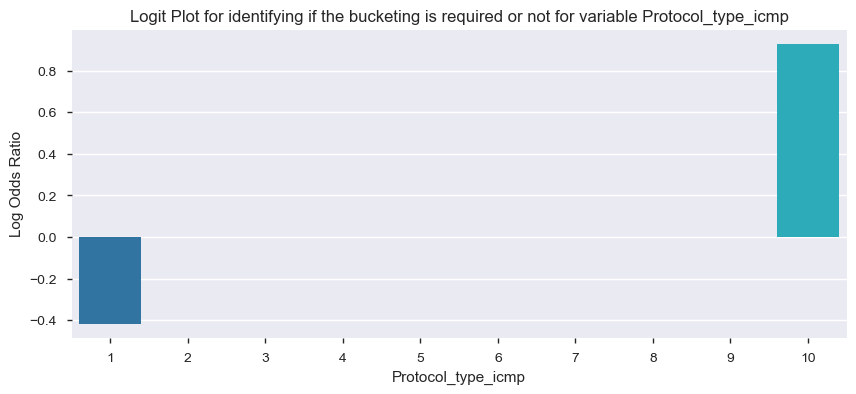

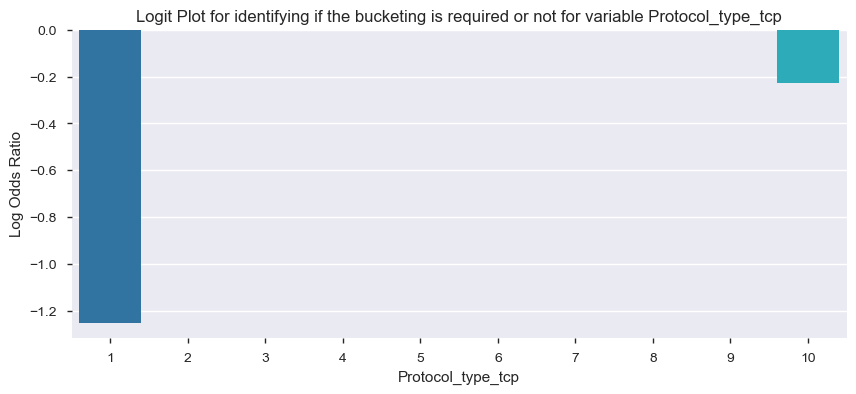

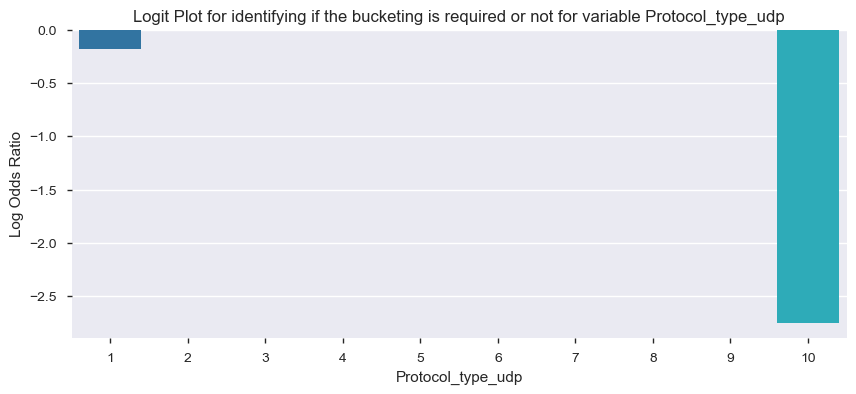

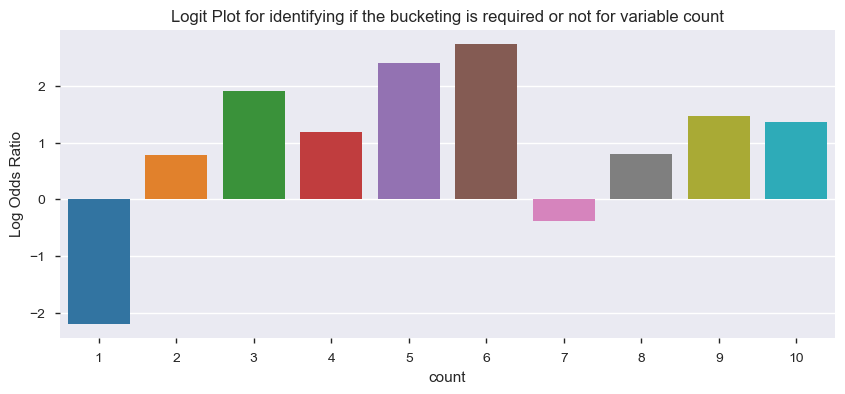

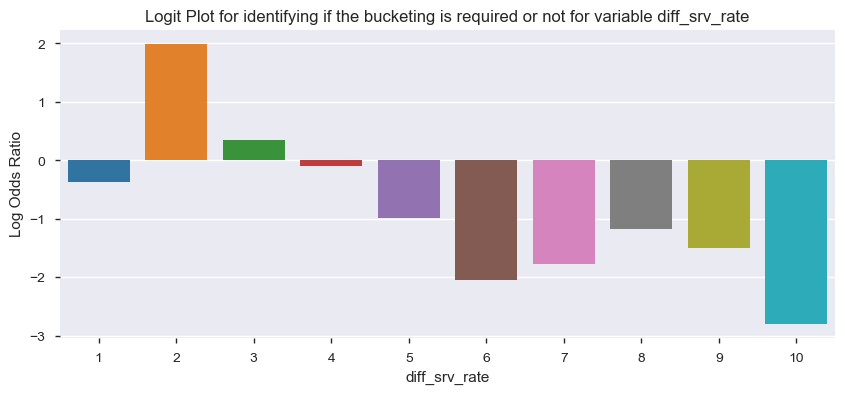

...

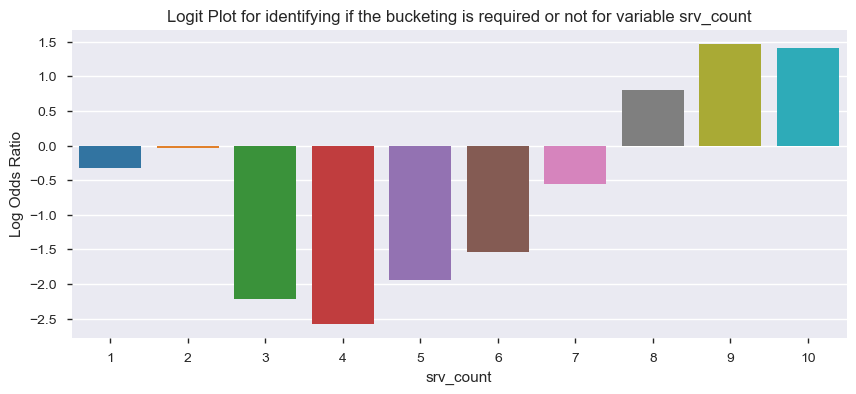

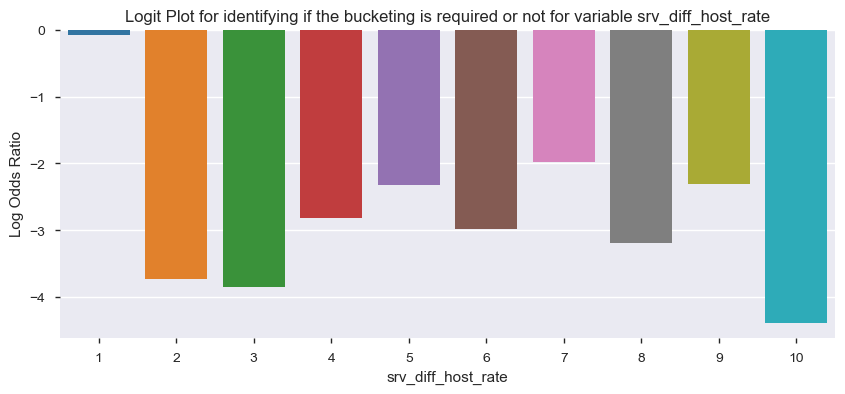

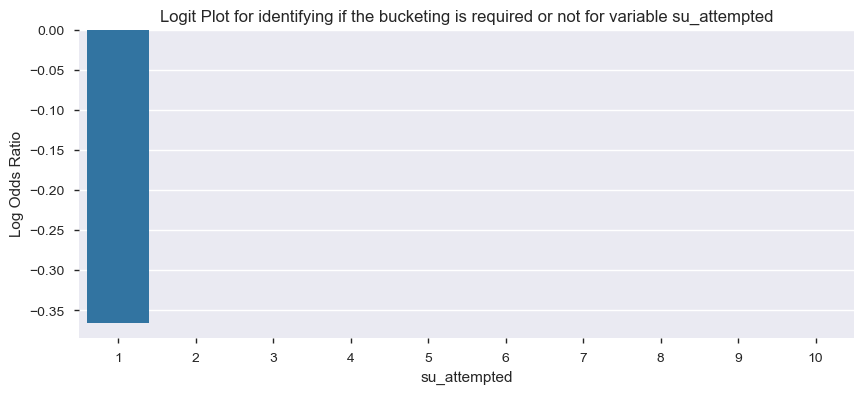

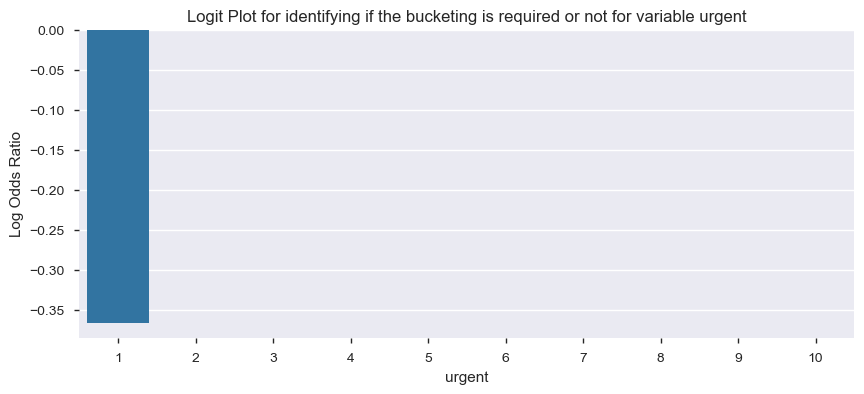

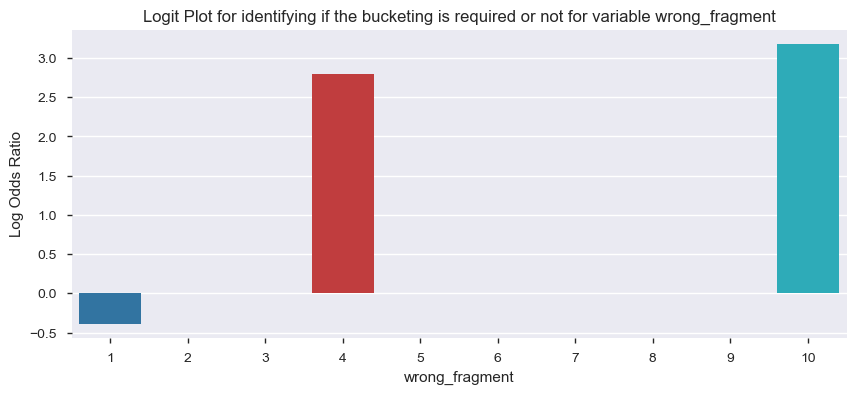

In [52]:
bp = PdfPages('WOE Plots.pdf')

for num_variable in DOS_DataFinal.columns.difference(['label']):
    binned = pd.cut(DOS_DataFinal[num_variable], bins=10, labels=list(range(1,11)))
    #binned = binned.dropna()
    odds = DOS_DataFinal.groupby(binned)['label'].sum() / (DOS_DataFinal.groupby(binned)['label'].count()-DOS_DataFinal.groupby(binned)['label'].sum())
    log_odds = np.log(odds)
    fig,axes = plt.subplots(figsize=(10,4))
    sns.barplot(x=log_odds.index,y=log_odds)
    plt.ylabel('Log Odds Ratio')
    plt.title(str('Logit Plot for identifying if the bucketing is required or not for variable ') + str(num_variable))
    bp.savefig(fig)

bp.close()

In [53]:
def calculate_woe_iv(dataset, feature, target):
    lst = []
    for i in range(dataset[feature].nunique()):
        val = list(dataset[feature].unique())[i]
        lst.append({
            'Value': val,
            'All': dataset[dataset[feature] == val].count()[feature],
            'Good': dataset[(dataset[feature] == val) & (dataset[target] == 0)].count()[feature],
            'Bad': dataset[(dataset[feature] == val) & (dataset[target] == 1)].count()[feature]
        })
        
    dset = pd.DataFrame(lst)
    dset['Distr_Good'] = dset['Good'] / dset['Good'].sum()
    dset['Distr_Bad'] = dset['Bad'] / dset['Bad'].sum()
    dset['WoE'] = np.log(dset['Distr_Good'] / dset['Distr_Bad'])
    dset = dset.replace({'WoE': {np.inf: 0, -np.inf: 0}})
    dset['IV'] = (dset['Distr_Good'] - dset['Distr_Bad']) * dset['WoE']
    iv = dset['IV'].sum()
    
    dset = dset.sort_values(by='WoE')
    
    return dset, iv

In [55]:
for col in DOS_DataFinal.columns:
    if col == 'label': continue
    else:
        print('WoE and IV for column: {}'.format(col))
        df, iv = calculate_woe_iv(DOS_DataFinal, col, 'label')
       # print(df)
        print('IV score: {:.2f}'.format(iv))
        print('\n')

WoE and IV for column: Protocol_type_icmp
IV score: 0.07


WoE and IV for column: Protocol_type_tcp
IV score: 0.12


WoE and IV for column: Protocol_type_udp
IV score: 0.43


WoE and IV for column: count
IV score: 3.71


WoE and IV for column: diff_srv_rate
IV score: 6.41


WoE and IV for column: dst_bytes
IV score: 1.67


WoE and IV for column: dst_host_count
IV score: 1.74


WoE and IV for column: dst_host_diff_srv_rate
IV score: 3.57


WoE and IV for column: dst_host_rerror_rate
IV score: 0.37


WoE and IV for column: dst_host_same_src_port_rate
IV score: 1.39


WoE and IV for column: dst_host_same_srv_rate
IV score: 3.53


WoE and IV for column: dst_host_serror_rate
IV score: 5.13


WoE and IV for column: dst_host_srv_count
IV score: 3.29


WoE and IV for column: dst_host_srv_diff_host_rate
IV score: 2.35


WoE and IV for column: duration
IV score: 0.16


WoE and IV for column: flag_OTH
IV score: 0.00


WoE and IV for column: flag_REJ
IV score: 0.20


WoE and IV for column: flag_RS

 You can select the variables based on the information value and below criteria
 
 - IV: <0.02, Predictive Power: Useless for prediction
 - IV: 0.02 - 0.1, Predictive Power: Weak predictor
 - IV: 0.1 - 0.2, Predictive Power: Medium predictor
 - IV: 0.3 - 0.5, Predictive Power: Storng predictor
 - IV: > 0.5, Predictive Power: Suspecious predictor or too good predictor

#### VIF Variance Inflation Factor

In [56]:
X_new =  X[X.columns.difference(['flag_OTH','flag_RSTOS0','flag_RSTR', 'flag_S2','flag_S3','flag_SH','is_guest_login','is_host_login','land','num_access_files','num_failed_logins','num_file_creations','num_root','num_shells','root_shell','service_IRC','service_X11','service_Z39_50','service_bgp','service_courier','service_courier','service_csnet_ns','service_ctf','service_daytime','service_discard','service_echo','service_efs','service_exec','service_ftp','service_gopher','service_hostnames','service_http_443','service_iso_tsap','service_klogin','service_kshell','service_ldap','service_login','service_mtp','service_name','service_netbios_dgm','service_netbios_ssn','service_netstat','service_nnsp','service_nntp','service_ntp_u','service_pm_dump','service_pop_2','service_pop_3','service_printer','service_red_i','service_remote_job','service_rje','service_shell','service_shell','service_sunrpc','service_systat','service_tftp_u','service_tim_i','service_urh_i','service_urp_i','service_uucp','service_uucp_path','service_vmnet','service_whois','su_attempted','urgent'])]
#X_new =  X
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(X_new.values, i) for i in range(X_new.shape[1])]
vif["features"] = X_new.columns

print(vif)

    VIF Factor                     features
0    10.445604                        count
1     1.634083                diff_srv_rate
2     1.179935                    dst_bytes
3     8.853129               dst_host_count
4    11.051106         dst_host_rerror_rate
5     1.905287  dst_host_same_src_port_rate
6    32.791131       dst_host_same_srv_rate
7    42.834246         dst_host_serror_rate
8    24.742299           dst_host_srv_count
9    54.547629                      flag_S0
10   40.314963                      flag_SF
11    7.767694                    logged_in
12   15.380334                  rerror_rate
13   36.463461                same_srv_rate
14   56.501391                  serror_rate
15    1.949805                service_ecr_i
16    6.659249                 service_http
17    1.679321              service_private
18    1.174510                    src_bytes
19    6.421676                    srv_count
20    1.299304           srv_diff_host_rate
21    1.179297               wro

### Splitting Train & Test Data Set

In [58]:
target = DOS_DataFinal[['label']].astype('int64')
features = X_new

In [59]:
#Splitting the data for sklearn methods
train_y, test_y, train_X, test_X = train_test_split(target,features, test_size=0.3, random_state=123)

In [61]:
#for logistic regression using statsmodels
train, test = train_test_split(DOS_DataFinal, test_size=0.3, random_state=0)

### Model Building - DOS

### 1. Logistic Regression  - DOS

In [62]:
#Build the model
model = LogisticRegression()
model_Reg = model.fit(train_X, train_y)

In [63]:
train_X['pred_prob'] = pd.DataFrame(model_Reg.predict_proba(train_X), index=train_X.index)[1]

In [64]:
test_X['pred_prob'] = pd.DataFrame(model_Reg.predict_proba(test_X),index=test_X.index)[1]

In [65]:
train = pd.concat([train_X, train_y], axis=1)

In [66]:
test = pd.concat([test_X, test_y], axis=1)

In [67]:
train['pred'] = np.where(train.pred_prob>0.489796, 1,0)
test['pred'] = np.where(test.pred_prob>0.489796, 1,0)

In [68]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(train.label, train.pred)
print(confusion_matrix)

[[53259   729]
 [ 3795 33525]]


In [69]:
print(metrics.classification_report(train.label, train.pred))

              precision    recall  f1-score   support

           0       0.93      0.99      0.96     53988
           1       0.98      0.90      0.94     37320

    accuracy                           0.95     91308
   macro avg       0.96      0.94      0.95     91308
weighted avg       0.95      0.95      0.95     91308



In [70]:
print(metrics.classification_report(test.label, test.pred))

              precision    recall  f1-score   support

           0       0.93      0.99      0.96     23066
           1       0.98      0.90      0.94     16067

    accuracy                           0.95     39133
   macro avg       0.96      0.94      0.95     39133
weighted avg       0.95      0.95      0.95     39133



#### Predicting Actual and Predicted Attack on Total Data - Logistic Regression

In [71]:
pd.crosstab(train.label, train.pred, rownames=['Actual attacks'], colnames=['Predicted attacks'])

Predicted attacks,0,1
Actual attacks,,
0,53259,729
1,3795,33525


In [72]:
pd.crosstab(test.label, test.pred, rownames=['Actual attacks'], colnames=['Predicted attacks'])

Predicted attacks,0,1
Actual attacks,,
0,22732,334
1,1620,14447


### 2. Random Forest Classifier

In [73]:
from sklearn.ensemble import RandomForestClassifier

pargrid_ada = {'n_estimators': [50, 60, 70, 80, 90, 100],
                'max_features': [5,6,7,8,9,10,11,12]}
gscv_Rf = GridSearchCV(estimator=RandomForestClassifier(), 
                        param_grid=pargrid_ada, 
                        cv=5,
                        verbose=True, n_jobs=-1)

In [74]:
gscv_results = gscv_Rf.fit(train_X, train_y)
gscv_results.best_score_

Fitting 5 folds for each of 48 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed: 11.4min finished


0.9993209795417707

In [80]:
gscv_results.best_params_

{'max_features': 6, 'n_estimators': 50}

In [81]:
##Train Data

print(metrics.classification_report(train_y,gscv_results.predict(train_X)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     53988
           1       1.00      1.00      1.00     37320

    accuracy                           1.00     91308
   macro avg       1.00      1.00      1.00     91308
weighted avg       1.00      1.00      1.00     91308



In [82]:
##Test Data

print(metrics.classification_report(test_y,gscv_results.predict(test_X)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     23066
           1       1.00      1.00      1.00     16067

    accuracy                           1.00     39133
   macro avg       1.00      1.00      1.00     39133
weighted avg       1.00      1.00      1.00     39133



In [83]:
## Train Data
pd.crosstab(train_y.label, gscv_results.predict(train_X), rownames=['Actual attacks'], colnames=['Predicted attacks'])

Predicted attacks,0,1
Actual attacks,,
0,53975,13
1,2,37318


In [84]:
## Test Data
pd.crosstab(test_y.label, gscv_results.predict(test_X), rownames=['Actual attacks'], colnames=['Predicted attacks'])

Predicted attacks,0,1
Actual attacks,,
0,23044,22
1,9,16058


### 3. XG Boost Classifier

In [85]:
import dask_ml.model_selection as dcv
from xgboost import XGBClassifier

In [86]:
xgb_estimator = XGBClassifier( learning_rate=0.01,
                               n_estimators=1000,
                               max_depth=5,
                               min_child_weight=1,
                               gamma=1,
                               subsample=0.8,
                               colsample_bytree=0.8,
                               n_jobs=-1,
                               reg_alpa=1,
                               scale_pos_weight=1,
                               random_state=42,
                               verbose=1)

In [87]:
xgb_estimator.fit(train_X, train_y)

XGBClassifier(base_score=0.5, booster=None, colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.8, gamma=1, gpu_id=-1,
              importance_type='gain', interaction_constraints=None,
              learning_rate=0.01, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              n_estimators=1000, n_jobs=-1, num_parallel_tree=1,
              objective='binary:logistic', random_state=42, reg_alpa=1,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=0.8,
              tree_method=None, validate_parameters=False, verbose=1,
              verbosity=None)

In [88]:
print(metrics.classification_report(train_y, xgb_estimator.predict(train_X)))

print(metrics.classification_report(test_y, xgb_estimator.predict(test_X)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     53988
           1       1.00      1.00      1.00     37320

    accuracy                           1.00     91308
   macro avg       1.00      1.00      1.00     91308
weighted avg       1.00      1.00      1.00     91308

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     23066
           1       1.00      1.00      1.00     16067

    accuracy                           1.00     39133
   macro avg       1.00      1.00      1.00     39133
weighted avg       1.00      1.00      1.00     39133



In [89]:
## Train Data
pd.crosstab(train_y.label, xgb_estimator.predict(train_X), rownames=['Actual attacks'], colnames=['Predicted attacks'])

Predicted attacks,0,1
Actual attacks,,
0,53964,24
1,13,37307


In [90]:
## Train Data
pd.crosstab(test_y.label, xgb_estimator.predict(test_X), rownames=['Actual attacks'], colnames=['Predicted attacks'])

Predicted attacks,0,1
Actual attacks,,
0,23042,24
1,11,16056


In [91]:
print(metrics.roc_auc_score(train_y,pd.DataFrame(xgb_estimator.predict_proba(train_X))[1]))

print(metrics.roc_auc_score(test_y,pd.DataFrame(xgb_estimator.predict_proba(test_X))[1]))

0.9999936987307171
0.999987035937493


#### 4. Adaptive Boosting

In [94]:
pargrid_ada = {'n_estimators': [100, 200, 400, 600, 800],
               'learning_rate': [10 ** x for x in range(-3, 3)]}

In [95]:
gscv_ada = GridSearchCV(estimator=AdaBoostClassifier(), 
                        param_grid=pargrid_ada, 
                        cv=5,
                        verbose=True, n_jobs=-1)

In [96]:
gscv_ada.fit(train_X, train_y)

Fitting 5 folds for each of 30 candidates, totalling 150 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed: 158.9min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=AdaBoostClassifier(algorithm='SAMME.R',
                                          base_estimator=None,
                                          learning_rate=1.0, n_estimators=50,
                                          random_state=None),
             iid='warn', n_jobs=-1,
             param_grid={'learning_rate': [0.001, 0.01, 0.1, 1, 10, 100],
                         'n_estimators': [100, 200, 400, 600, 800]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=True)

In [97]:
print(gscv_ada.best_params_,gscv_ada.best_score_)

{'learning_rate': 1, 'n_estimators': 800} 0.9987952862837868


In [98]:
#train Data

print(metrics.classification_report(train_y,gscv_ada.predict(train_X)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     53988
           1       1.00      1.00      1.00     37320

    accuracy                           1.00     91308
   macro avg       1.00      1.00      1.00     91308
weighted avg       1.00      1.00      1.00     91308



In [99]:
#Test Data

print(metrics.classification_report(test_y,gscv_ada.predict(test_X)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     23066
           1       1.00      1.00      1.00     16067

    accuracy                           1.00     39133
   macro avg       1.00      1.00      1.00     39133
weighted avg       1.00      1.00      1.00     39133



In [100]:
## Train Data
pd.crosstab(train_y.label, gscv_ada.predict(train_X), rownames=['Actual attacks'], colnames=['Predicted attacks'])

Predicted attacks,0,1
Actual attacks,,
0,53939,49
1,31,37289


In [101]:
## Test Data
pd.crosstab(test_y.label, gscv_ada.predict(test_X), rownames=['Actual attacks'], colnames=['Predicted attacks'])

Predicted attacks,0,1
Actual attacks,,
0,23039,27
1,30,16037


###  2. Feature Selection and Model Building - Probe Attack

In [105]:
Probe_DataFinal = pd.concat([Probe_Train_Data,Probe_Test_Data],axis=0)

In [106]:
Probe_DataFinal['label'] = Probe_DataFinal.label.astype('int64')

### variable reduction (feature selection/reduction)

- WOE - Binomial classification
- RFE
- SelectKBest
- VIF
- PCA

#### 1. RFE Feature Elimination

In [107]:
X = Probe_DataFinal[Probe_DataFinal.columns.difference(['label'])]
classifier = RandomForestClassifier()
rfe = RFE(classifier, 15)
rfe = rfe.fit(X, Probe_DataFinal[['label']] )

In [108]:
imp_vars_RFE = list(X.columns[rfe.support_])

In [109]:
imp_vars_RFE

['diff_srv_rate',
 'dst_bytes',
 'dst_host_count',
 'dst_host_diff_srv_rate',
 'dst_host_rerror_rate',
 'dst_host_same_src_port_rate',
 'dst_host_same_srv_rate',
 'dst_host_srv_count',
 'dst_host_srv_diff_host_rate',
 'flag_SF',
 'same_srv_rate',
 'service_eco_i',
 'service_private',
 'src_bytes',
 'srv_count']

#### 2. Select K Best

In [111]:
X = Probe_DataFinal[Probe_DataFinal.columns.difference(['label'])]
SKB = SelectKBest(f_classif, k=15).fit(X, Probe_DataFinal[['label']] )

In [112]:
SKB.get_support()
imp_vars_SKB = list(X.columns[SKB.get_support()])

In [113]:
imp_vars_SKB

['Protocol_type_icmp',
 'diff_srv_rate',
 'dst_host_diff_srv_rate',
 'dst_host_rerror_rate',
 'dst_host_same_src_port_rate',
 'dst_host_same_srv_rate',
 'dst_host_srv_count',
 'dst_host_srv_diff_host_rate',
 'flag_SF',
 'logged_in',
 'rerror_rate',
 'same_srv_rate',
 'service_eco_i',
 'service_http',
 'service_private']

### Final List (Select K Best & RFE)

In [114]:
Final_list = list(set(imp_vars_SKB  + imp_vars_RFE))

In [115]:
X = Probe_DataFinal[Final_list]

### Using WOE (Weight of Evidence)

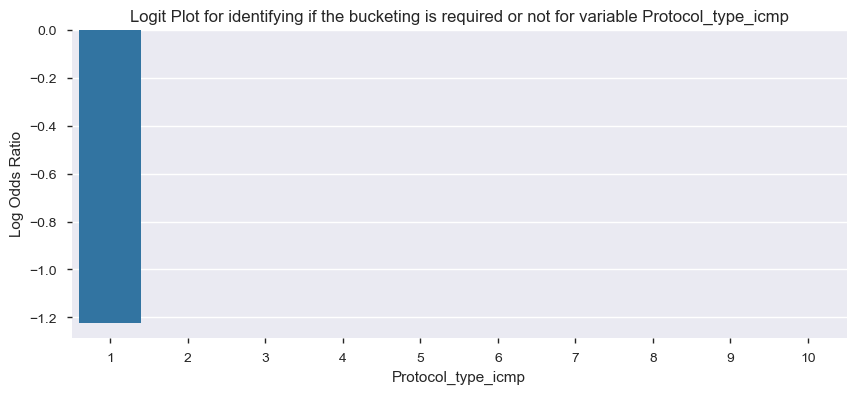

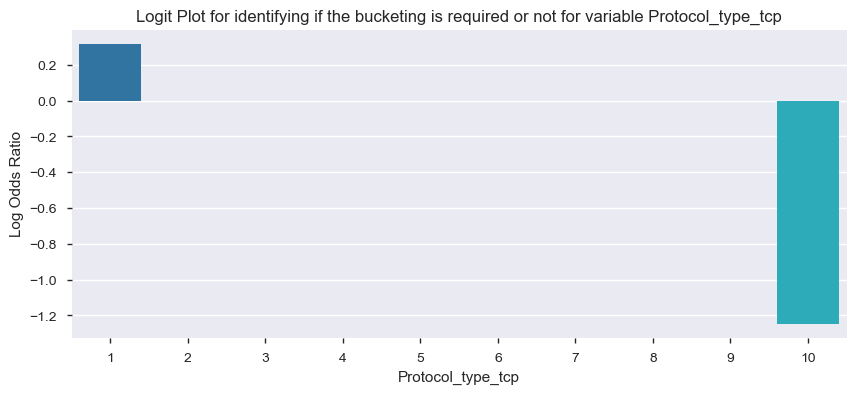

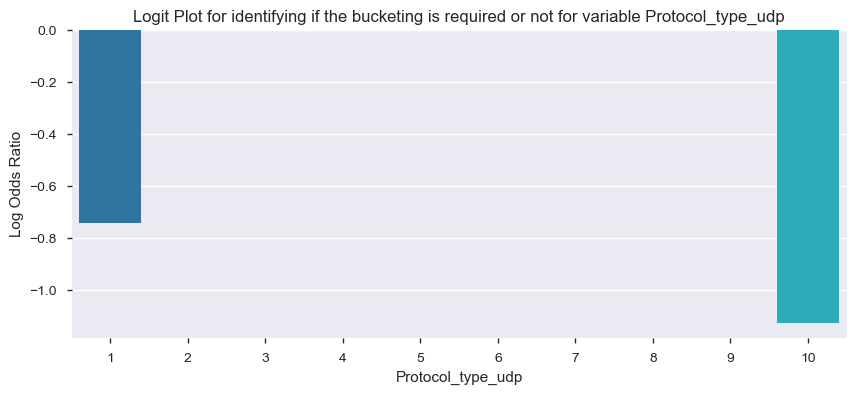

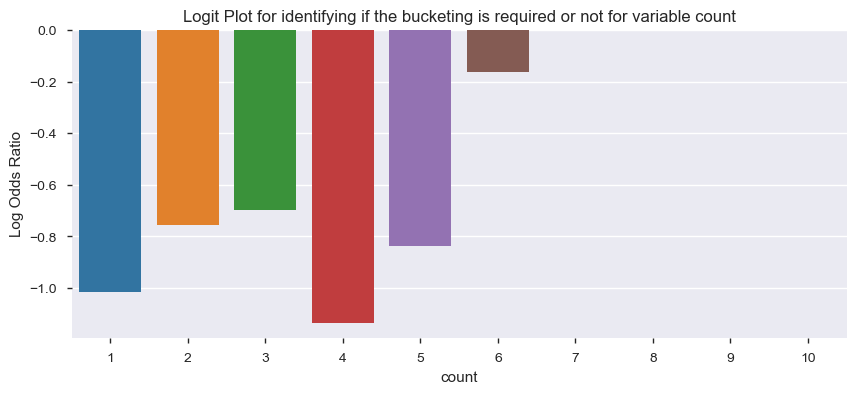

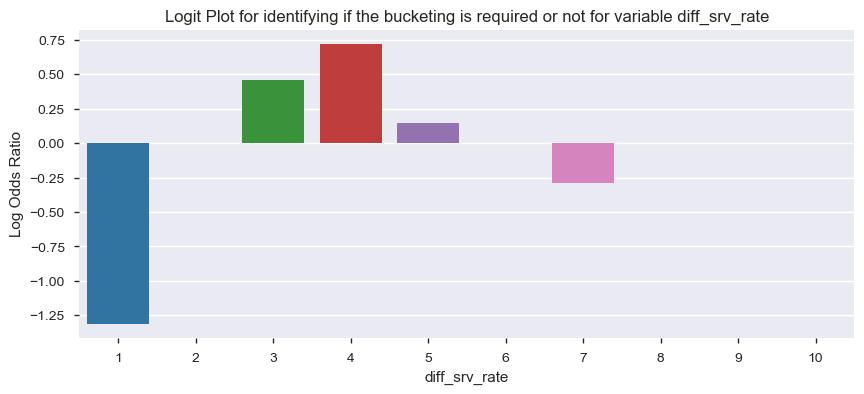

...

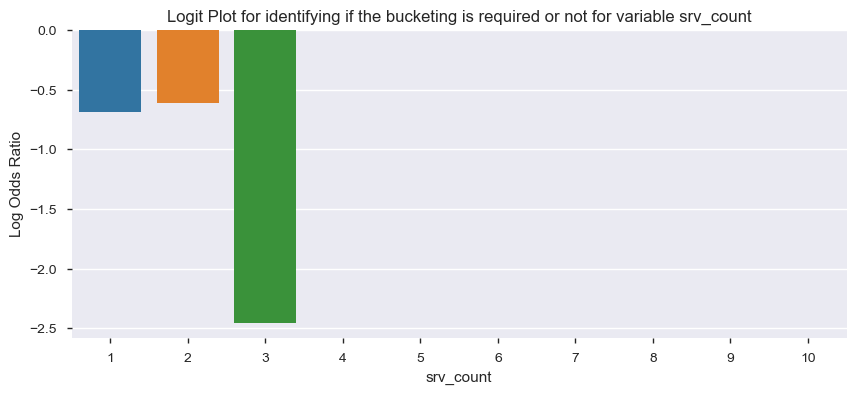

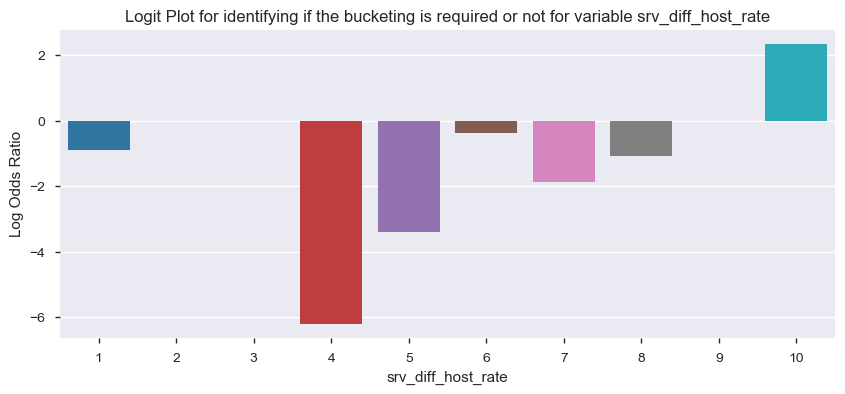

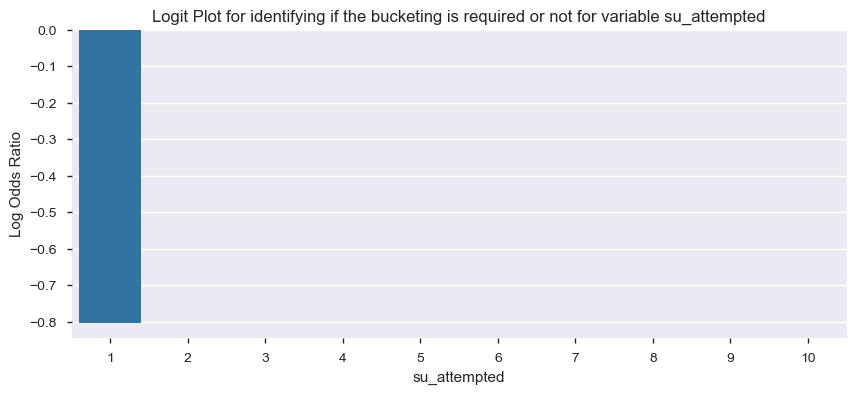

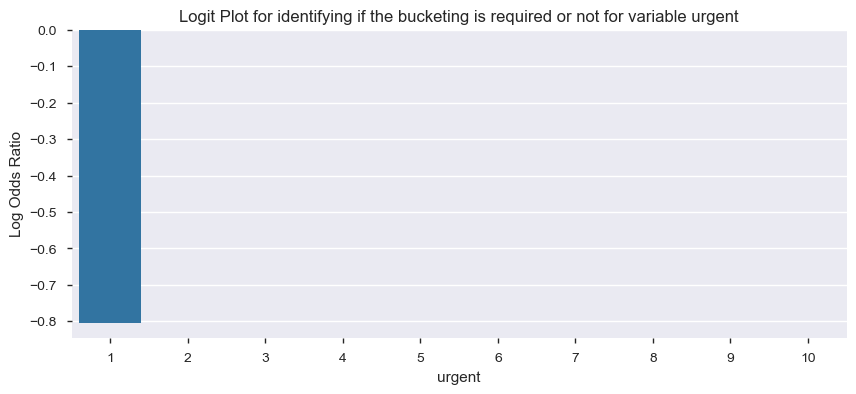

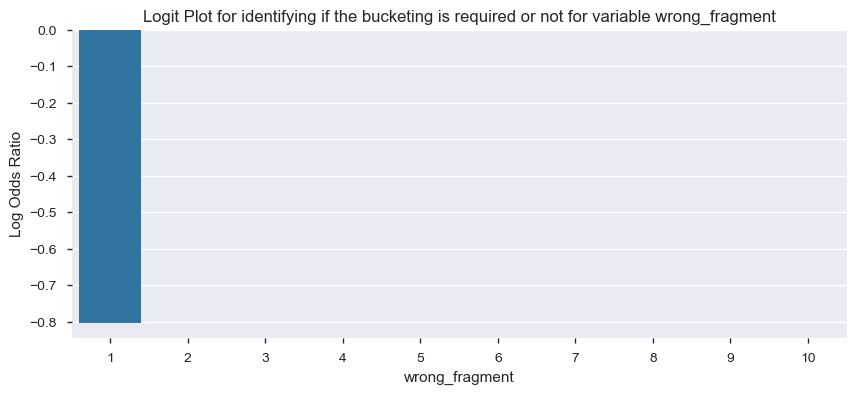

In [116]:
bp = PdfPages('WOE Plots.pdf')

for num_variable in Probe_DataFinal.columns.difference(['label']):
    binned = pd.cut(Probe_DataFinal[num_variable], bins=10, labels=list(range(1,11)))
    #binned = binned.dropna()
    odds = Probe_DataFinal.groupby(binned)['label'].sum() / (Probe_DataFinal.groupby(binned)['label'].count()-Probe_DataFinal.groupby(binned)['label'].sum())
    log_odds = np.log(odds)
    fig,axes = plt.subplots(figsize=(10,4))
    sns.barplot(x=log_odds.index,y=log_odds)
    plt.ylabel('Log Odds Ratio')
    plt.title(str('Logit Plot for identifying if the bucketing is required or not for variable ') + str(num_variable))
    bp.savefig(fig)

bp.close()

#### VIF Variance Inflation Factor

In [125]:
X_new =  X[X.columns.difference(['Protocol_type_icmp','dst_bytes', 'dst_host_rerror_rate','flag_OTH','flag_SH','flag_REJ','flag_RSTO','flag_RSTOS0','flag_RSTR','flag_S0','flag_SF','flag_SH','hot','is_host_login','land','num_access_files','num_outbound_cmds','num_root','num_shells','root_shell','service_Z39_50','service_aol','service_bgp','service_courier','service_csnet_ns','service_ctf','service_daytime','service_discard','service_echo','service_eco_i','service_efs','service_exec','service_gopher','service_harvest','service_hostnames','service_http','service_http_2784','service_http_443','service_http_8001','service_imap4','service_iso_tsap','service_klogin','service_kshell','service_ldap','service_link','service_login','service_mtp','service_name','service_netbios_dgm','service_netbios_ns','service_netbios_ssn','service_netstat','service_nnsp','service_nntp','service_ntp_u','service_pm_dump','service_pop_2','service_pop_3','service_printer','service_private','service_red_i','service_remote_job','service_rje','service_shell','service_sql_net','service_ssh','service_sunrpc','service_supdup','service_systat','service_tftp_u','service_tim_i','service_urh_i','service_uucp','service_uucp_path','service_vmnet','service_whois','src_bytes','su_attempted','urgent','wrong_fragment'])]
#X_new =  X
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(X_new.values, i) for i in range(X_new.shape[1])]
vif["features"] = X_new.columns

print(vif)

    VIF Factor                     features
0     2.212914                diff_srv_rate
1     4.437910               dst_host_count
2     2.800696       dst_host_diff_srv_rate
3     2.193454  dst_host_same_src_port_rate
4    29.560372       dst_host_same_srv_rate
5    21.146779           dst_host_srv_count
6     1.700661  dst_host_srv_diff_host_rate
7     5.963002                    logged_in
8     1.897871                  rerror_rate
9    18.171253                same_srv_rate
10    1.884519                    srv_count


### Splitting the data into train & test 

In [135]:
target = Probe_DataFinal[['label']].astype('int64')
features = X_new

In [136]:
#Splitting the data for sklearn methods
train_y, test_y, train_X, test_X = train_test_split(target,features, test_size=0.3, random_state=123)

### Model Building - DOS

### 1. Logistic Regression  - DOS

In [145]:
#Build the model
model = LogisticRegression()
model_Reg = model.fit(train_X, train_y)

In [146]:
train_X['pred_prob'] = pd.DataFrame(model_Reg.predict_proba(train_X), index=train_X.index)[1]
test_X['pred_prob'] = pd.DataFrame(model_Reg.predict_proba(test_X),index=test_X.index)[1]

In [147]:
train = pd.concat([train_X, train_y], axis=1)
test = pd.concat([test_X, test_y], axis=1)

In [148]:
train['pred'] = np.where(train.pred_prob>0.489796, 2,0)
test['pred'] = np.where(test.pred_prob>0.489796, 2,0)

In [149]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(train.label, train.pred)
print(confusion_matrix)

[[52273  1668]
 [ 1770  8080]]


In [150]:
print(metrics.classification_report(train.label, train.pred))

              precision    recall  f1-score   support

           0       0.97      0.97      0.97     53941
           2       0.83      0.82      0.82      9850

    accuracy                           0.95     63791
   macro avg       0.90      0.89      0.90     63791
weighted avg       0.95      0.95      0.95     63791



In [151]:
print(metrics.classification_report(test.label, test.pred))

              precision    recall  f1-score   support

           0       0.97      0.97      0.97     23113
           2       0.84      0.83      0.83      4227

    accuracy                           0.95     27340
   macro avg       0.90      0.90      0.90     27340
weighted avg       0.95      0.95      0.95     27340



In [152]:
## Train predict

pd.crosstab(train.label, train.pred, rownames=['Actual attacks'], colnames=['Predicted attacks'])

Predicted attacks,0,2
Actual attacks,,
0,52273,1668
2,1770,8080


In [153]:
pd.crosstab(test.label, test.pred, rownames=['Actual attacks'], colnames=['Predicted attacks'])

Predicted attacks,0,2
Actual attacks,,
0,22424,689
2,714,3513


### 2. Random Forest Classifier

In [155]:
from sklearn.ensemble import RandomForestClassifier

pargrid_ada = {'n_estimators': [50, 60, 70, 80, 90, 100],
                'max_features': [5,6,7,8,9,10,11,12]}
gscv_Rf = GridSearchCV(estimator=RandomForestClassifier(), 
                        param_grid=pargrid_ada, 
                        cv=5,
                        verbose=True, n_jobs=-1)

In [156]:
gscv_results = gscv_Rf.fit(train_X, train_y)
gscv_results.best_score_

Fitting 5 folds for each of 48 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   41.1s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed: 1036.1min
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed: 1038.2min finished


0.9934003229295668

In [157]:
##Train Data

print(metrics.classification_report(train_y,gscv_results.predict(train_X)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     53941
           2       1.00      1.00      1.00      9850

    accuracy                           1.00     63791
   macro avg       1.00      1.00      1.00     63791
weighted avg       1.00      1.00      1.00     63791



In [158]:
##Test Data

print(metrics.classification_report(test_y,gscv_results.predict(test_X)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     23113
           2       0.98      0.97      0.98      4227

    accuracy                           0.99     27340
   macro avg       0.99      0.99      0.99     27340
weighted avg       0.99      0.99      0.99     27340



In [159]:
## Train Data
pd.crosstab(train_y.label, gscv_results.predict(train_X), rownames=['Actual attacks'], colnames=['Predicted attacks'])

Predicted attacks,0,2
Actual attacks,,
0,53913,28
2,31,9819


In [160]:
## Test Data
pd.crosstab(test_y.label, gscv_results.predict(test_X), rownames=['Actual attacks'], colnames=['Predicted attacks'])

Predicted attacks,0,2
Actual attacks,,
0,23041,72
2,112,4115


### 3. XGBoost Classifier

In [161]:
from xgboost import XGBClassifier

In [162]:
xgb_estimator = XGBClassifier( learning_rate=0.01,
                               n_estimators=1000,
                               max_depth=5,
                               min_child_weight=1,
                               gamma=1,
                               subsample=0.8,
                               colsample_bytree=0.8,
                               n_jobs=-1,
                               reg_alpa=1,
                               scale_pos_weight=1,
                               random_state=42,
                               verbose=1)

In [163]:
xgb_estimator.fit(train_X,train_y)

XGBClassifier(base_score=0.5, booster=None, colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.8, gamma=1, gpu_id=-1,
              importance_type='gain', interaction_constraints=None,
              learning_rate=0.01, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              n_estimators=1000, n_jobs=-1, num_parallel_tree=1,
              objective='binary:logistic', random_state=42, reg_alpa=1,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=0.8,
              tree_method=None, validate_parameters=False, verbose=1,
              verbosity=None)

In [165]:
##Train Data

print(metrics.classification_report(train_y,xgb_estimator.predict(train_X)))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00     53941
           2       0.98      0.97      0.98      9850

    accuracy                           0.99     63791
   macro avg       0.99      0.98      0.99     63791
weighted avg       0.99      0.99      0.99     63791



In [166]:
##Test Data

print(metrics.classification_report(test_y,xgb_estimator.predict(test_X)))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99     23113
           2       0.98      0.97      0.97      4227

    accuracy                           0.99     27340
   macro avg       0.99      0.98      0.98     27340
weighted avg       0.99      0.99      0.99     27340



In [167]:
## Train Data
pd.crosstab(train_y.label, gscv_results.predict(train_X), rownames=['Actual attacks'], colnames=['Predicted attacks'])

Predicted attacks,0,2
Actual attacks,,
0,53913,28
2,31,9819


In [168]:
## Test Data
pd.crosstab(test_y.label, gscv_results.predict(test_X), rownames=['Actual attacks'], colnames=['Predicted attacks'])

Predicted attacks,0,2
Actual attacks,,
0,23041,72
2,112,4115


### 4. Adaptive Bossting

In [169]:
pargrid_ada = {'n_estimators': [100, 200, 400, 600, 800],
               'learning_rate': [10 ** x for x in range(-3, 3)]}

In [170]:
gscv_ada = GridSearchCV(estimator=AdaBoostClassifier(), 
                        param_grid=pargrid_ada, 
                        cv=5,
                        verbose=True, n_jobs=-1)

In [171]:
gscv_ada.fit(train_X, train_y)

Fitting 5 folds for each of 30 candidates, totalling 150 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed: 14.4min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=AdaBoostClassifier(algorithm='SAMME.R',
                                          base_estimator=None,
                                          learning_rate=1.0, n_estimators=50,
                                          random_state=None),
             iid='warn', n_jobs=-1,
             param_grid={'learning_rate': [0.001, 0.01, 0.1, 1, 10, 100],
                         'n_estimators': [100, 200, 400, 600, 800]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=True)

In [172]:
print(gscv_ada.best_estimator_ , gscv_ada.best_score_)

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None, learning_rate=1,
                   n_estimators=800, random_state=None) 0.978649025724632


In [173]:
#train Data

print(metrics.classification_report(train_y,gscv_ada.predict(train_X)))

#Test Data

print(metrics.classification_report(test_y,gscv_ada.predict(test_X)))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99     53941
           2       0.94      0.93      0.94      9850

    accuracy                           0.98     63791
   macro avg       0.97      0.96      0.96     63791
weighted avg       0.98      0.98      0.98     63791

              precision    recall  f1-score   support

           0       0.99      0.99      0.99     23113
           2       0.94      0.92      0.93      4227

    accuracy                           0.98     27340
   macro avg       0.96      0.95      0.96     27340
weighted avg       0.98      0.98      0.98     27340



In [174]:
## Train Data
pd.crosstab(train_y.label, gscv_ada.predict(train_X), rownames=['Actual attacks'], colnames=['Predicted attacks'])

Predicted attacks,0,2
Actual attacks,,
0,53406,535
2,729,9121


In [176]:
## Test Data
pd.crosstab(test_y.label, gscv_ada.predict(test_X), rownames=['Actual attacks'], colnames=['Predicted attacks'])

Predicted attacks,0,2
Actual attacks,,
0,22856,257
2,334,3893


###  3. Feature Selection and Model Building - R2L Attack

In [177]:
R2L_DataFinal = pd.concat([R2L_Train_Data,R2L_Test_Data],axis=0)

In [178]:
R2L_DataFinal['label'] = R2L_DataFinal.label.astype('int64')

### variable reduction (feature selection/reduction)

- WOE - Binomial classification
- RFE
- SelectKBest
- VIF
- PCA

#### 1. Recursie Feature ELimination

In [186]:
X = R2L_DataFinal[R2L_DataFinal.columns.difference(['label'])]
classifier = RandomForestClassifier()
rfe = RFE(classifier, 20)
rfe = rfe.fit(X, R2L_DataFinal[['label']] )

In [187]:
imp_vars_RFE = list(X.columns[rfe.support_])

In [188]:
imp_vars_RFE

['count',
 'dst_bytes',
 'dst_host_count',
 'dst_host_diff_srv_rate',
 'dst_host_rerror_rate',
 'dst_host_same_src_port_rate',
 'dst_host_same_srv_rate',
 'dst_host_srv_count',
 'dst_host_srv_diff_host_rate',
 'duration',
 'hot',
 'is_guest_login',
 'num_failed_logins',
 'service_ftp',
 'service_ftp_data',
 'service_pop_3',
 'service_private',
 'service_telnet',
 'src_bytes',
 'srv_count']

#### 2. Select K Best

In [189]:
X = R2L_DataFinal[R2L_DataFinal.columns.difference(['label'])]
SKB = SelectKBest(f_classif, k=20).fit(X, R2L_DataFinal[['label']] )

In [190]:
SKB.get_support()
imp_vars_SKB = list(X.columns[SKB.get_support()])

In [191]:
imp_vars_SKB

['count',
 'dst_host_same_src_port_rate',
 'dst_host_same_srv_rate',
 'dst_host_srv_count',
 'dst_host_srv_diff_host_rate',
 'flag_RSTO',
 'hot',
 'is_guest_login',
 'logged_in',
 'num_failed_logins',
 'service_domain_u',
 'service_ftp',
 'service_ftp_data',
 'service_http',
 'service_pop_3',
 'service_private',
 'service_smtp',
 'service_telnet',
 'srv_count',
 'srv_diff_host_rate']

### Final Data based on RFE & Select K-Best

In [192]:
Final_list = list(set(imp_vars_SKB  + imp_vars_RFE))

In [193]:
X = R2L_DataFinal[Final_list]

### Using WOE (Weight of Evidence)

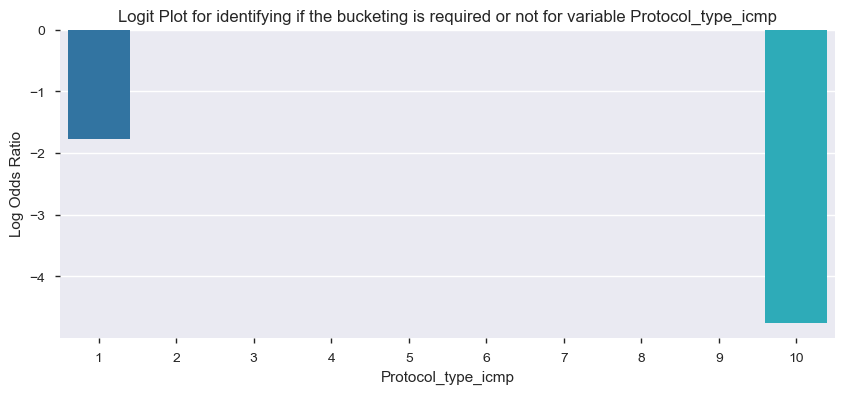

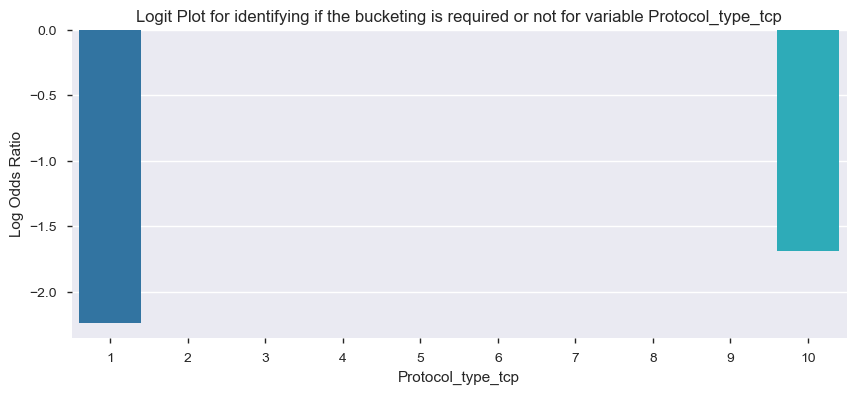

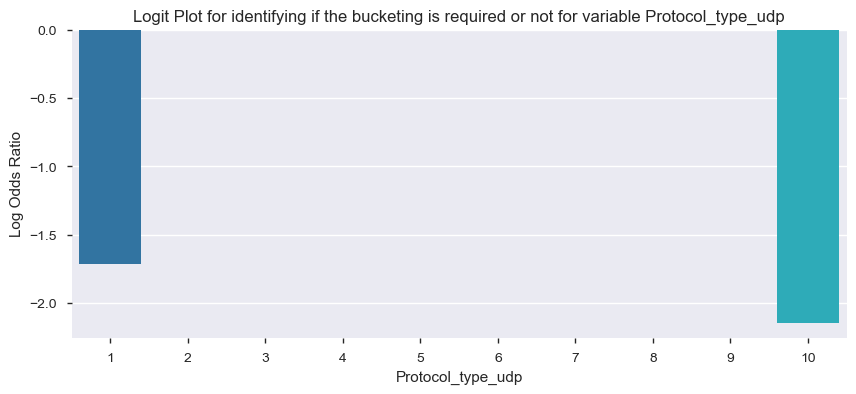

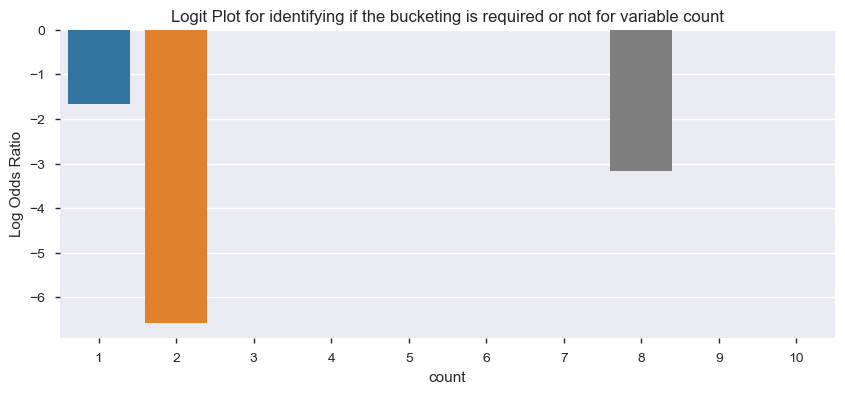

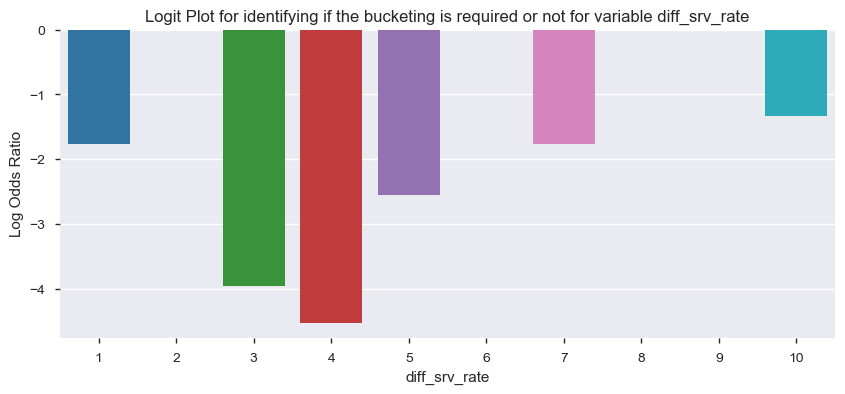

...

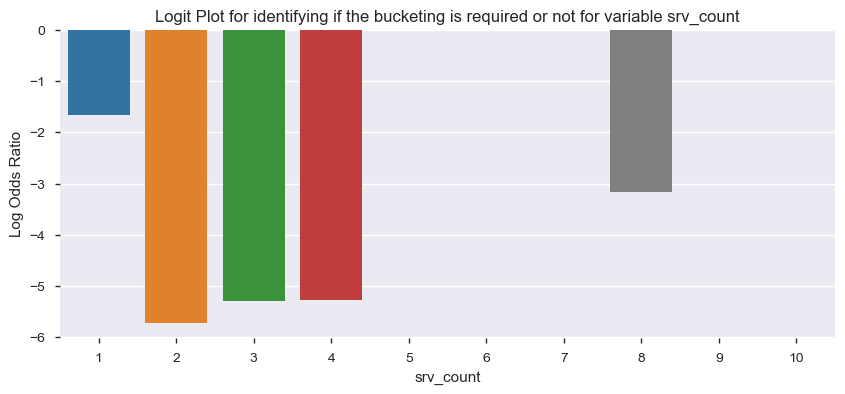

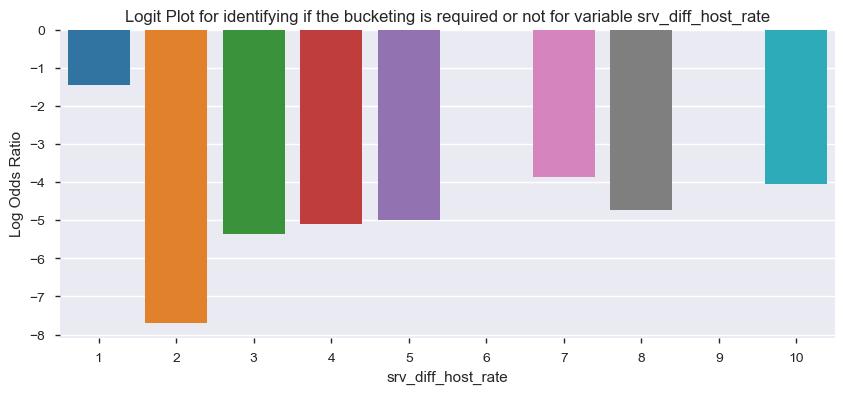

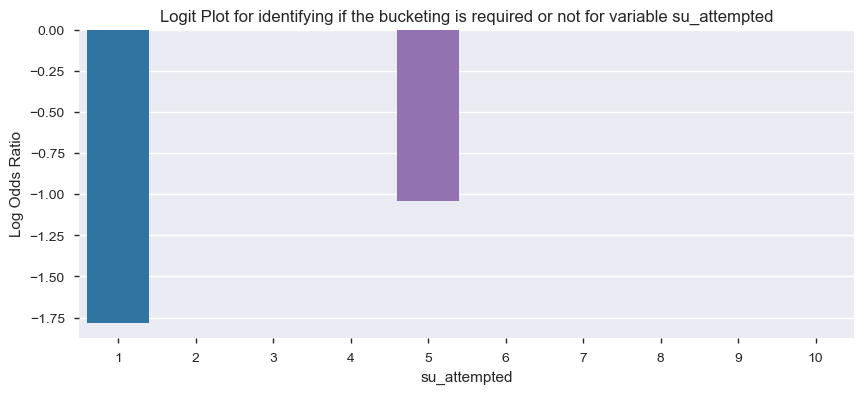

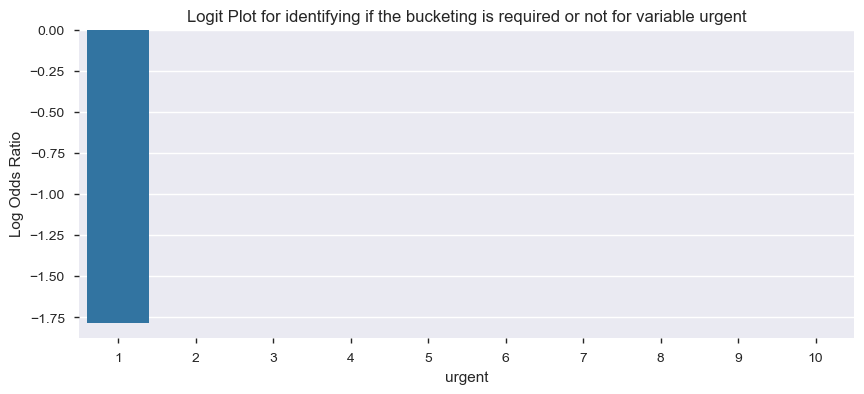

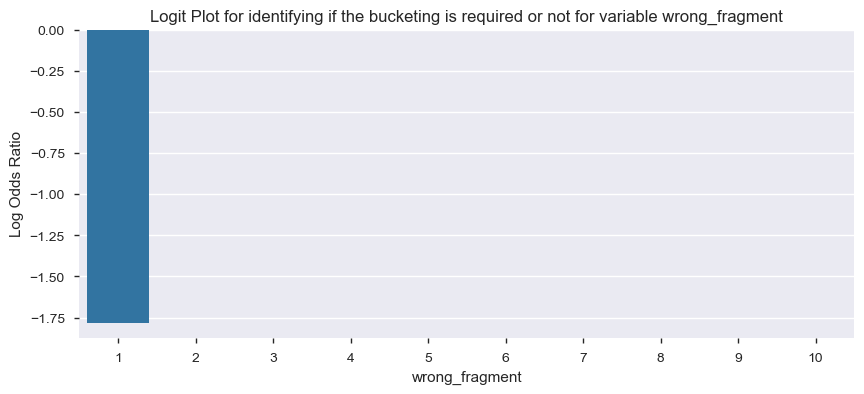

In [194]:
bp = PdfPages('WOE Plots.pdf')

for num_variable in R2L_DataFinal.columns.difference(['label']):
    binned = pd.cut(R2L_DataFinal[num_variable], bins=10, labels=list(range(1,11)))
    #binned = binned.dropna()
    odds = R2L_DataFinal.groupby(binned)['label'].sum() / (R2L_DataFinal.groupby(binned)['label'].count()-R2L_DataFinal.groupby(binned)['label'].sum())
    log_odds = np.log(odds)
    fig,axes = plt.subplots(figsize=(10,4))
    sns.barplot(x=log_odds.index,y=log_odds)
    plt.ylabel('Log Odds Ratio')
    plt.title(str('Logit Plot for identifying if the bucketing is required or not for variable ') + str(num_variable))
    bp.savefig(fig)

bp.close()

### Varience Inflation Factor

In [196]:
X_new =  X[X.columns.difference(['flag_OTH','flag_SH','flag_RSTOS0','flag_SH','hot','is_guest_login','is_host_login','land','num_outbound_cmds','num_root','service_Z39_50','service_aol','service_bgp','service_courier','service_csnet_ns','service_ctf','service_daytime','service_discard','service_echo','service_eco_i','service_efs','service_exec','service_gopher','service_harvest','service_hostnames','service_http_2784','service_http_443','service_http_8001','service_imap4','service_iso_tsap','service_klogin','service_kshell','service_ldap','service_link','service_login','service_mtp','service_name','service_netbios_dgm','service_netbios_ns','service_netbios_ssn','service_netstat','service_nnsp','service_nntp','service_ntp_u','service_pm_dump','service_pop_2','service_pop_3','service_printer','service_private','service_red_i','service_remote_job','service_rje','service_shell','service_sql_net','service_ssh','service_sunrpc','service_supdup','service_systat','service_tftp_u','service_tim_i','service_urh_i','service_uucp','service_uucp_path','service_vmnet','service_whois','src_bytes','urgent','wrong_fragment'])]
#X_new =  X
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(X_new.values, i) for i in range(X_new.shape[1])]
vif["features"] = X_new.columns

print(vif)

    VIF Factor                     features
0    13.488778                        count
1     1.013322                    dst_bytes
2     3.692689               dst_host_count
3     1.809428       dst_host_diff_srv_rate
4     1.634142         dst_host_rerror_rate
5     2.330817  dst_host_same_src_port_rate
6    30.121175       dst_host_same_srv_rate
7    27.337571           dst_host_srv_count
8     1.447163  dst_host_srv_diff_host_rate
9     1.261049                     duration
10    1.054705                    flag_RSTO
11   13.690868                    logged_in
12    1.463211            num_failed_logins
13    3.529407             service_domain_u
14    1.493369                  service_ftp
15    1.915662             service_ftp_data
16   19.859919                 service_http
17    3.495189                 service_smtp
18    1.741993               service_telnet
19   16.379563                    srv_count
20    1.479407           srv_diff_host_rate


### Splitting the data into train & test 

In [197]:
target = R2L_DataFinal[['label']].astype('int64')
features = X_new

In [198]:
#Splitting the data for sklearn methods
train_y, test_y, train_X, test_X = train_test_split(target,features, test_size=0.3, random_state=123)

### Model Building - DOS

### 1. Logistic Regression  - DOS

In [199]:
#Build the model
model = LogisticRegression()
model_Reg = model.fit(train_X, train_y)

In [200]:
train_X['pred_prob'] = pd.DataFrame(model_Reg.predict_proba(train_X), index=train_X.index)[1]
test_X['pred_prob'] = pd.DataFrame(model_Reg.predict_proba(test_X),index=test_X.index)[1]

In [201]:
train = pd.concat([train_X, train_y], axis=1)
test = pd.concat([test_X, test_y], axis=1)

In [203]:
train['pred'] = np.where(train.pred_prob>0.489796, 3,0)
test['pred'] = np.where(test.pred_prob>0.489796, 3,0)

In [204]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(train.label, train.pred)
print(confusion_matrix)

[[53959    26]
 [ 2582    86]]


In [205]:
print(metrics.classification_report(train.label, train.pred))

              precision    recall  f1-score   support

           0       0.95      1.00      0.98     53985
           3       0.77      0.03      0.06      2668

    accuracy                           0.95     56653
   macro avg       0.86      0.52      0.52     56653
weighted avg       0.95      0.95      0.93     56653



In [206]:
print(metrics.classification_report(test.label, test.pred))

              precision    recall  f1-score   support

           0       0.95      1.00      0.98     23069
           3       0.79      0.04      0.08      1212

    accuracy                           0.95     24281
   macro avg       0.87      0.52      0.53     24281
weighted avg       0.94      0.95      0.93     24281



In [210]:
## Train predict

pd.crosstab(train.label, train.pred, rownames=['Actual attacks'], colnames=['Predicted attacks'])

Predicted attacks,0,3
Actual attacks,,
0,53959,26
3,2582,86


In [211]:
pd.crosstab(test.label, test.pred, rownames=['Actual attacks'], colnames=['Predicted attacks'])

Predicted attacks,0,3
Actual attacks,,
0,23055,14
3,1159,53


### 2. Random Forest Classifier

In [212]:
from sklearn.ensemble import RandomForestClassifier

pargrid_ada = {'n_estimators': [50, 60, 70, 80, 90, 100],
                'max_features': [5,6,7,8,9,10,11,12]}
gscv_Rf = GridSearchCV(estimator=RandomForestClassifier(), 
                        param_grid=pargrid_ada, 
                        cv=5,
                        verbose=True, n_jobs=-1)

In [213]:
gscv_results = gscv_Rf.fit(train_X, train_y)
gscv_results.best_score_

Fitting 5 folds for each of 48 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   39.9s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:  5.4min finished


0.9938396907489453

In [214]:
##Train Data

print(metrics.classification_report(train_y,gscv_results.predict(train_X)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     53985
           3       0.99      0.99      0.99      2668

    accuracy                           1.00     56653
   macro avg       0.99      0.99      0.99     56653
weighted avg       1.00      1.00      1.00     56653



In [215]:
##Test Data

print(metrics.classification_report(test_y,gscv_results.predict(test_X)))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00     23069
           3       0.95      0.90      0.92      1212

    accuracy                           0.99     24281
   macro avg       0.97      0.95      0.96     24281
weighted avg       0.99      0.99      0.99     24281



In [216]:
## Test Data
pd.crosstab(test_y.label, gscv_results.predict(test_X), rownames=['Actual attacks'], colnames=['Predicted attacks'])

Predicted attacks,0,3
Actual attacks,,
0,23014,55
3,124,1088


In [221]:
## Train Data
pd.crosstab(train_y.label, gscv_results.predict(train_X), rownames=['Actual attacks'], colnames=['Predicted attacks'])

Predicted attacks,0,3
Actual attacks,,
0,53954,31
3,28,2640


### 3. XGBoost Classifier

In [222]:
from xgboost import XGBClassifier

In [223]:
xgb_estimator = XGBClassifier( learning_rate=0.01,
                               n_estimators=1000,
                               max_depth=5,
                               min_child_weight=1,
                               gamma=1,
                               subsample=0.8,
                               colsample_bytree=0.8,
                               n_jobs=-1,
                               reg_alpa=1,
                               scale_pos_weight=1,
                               random_state=42,
                               verbose=1)

In [225]:
xgb_estimator.fit(train_X,train_y)

XGBClassifier(base_score=0.5, booster=None, colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.8, gamma=1, gpu_id=-1,
              importance_type='gain', interaction_constraints=None,
              learning_rate=0.01, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              n_estimators=1000, n_jobs=-1, num_parallel_tree=1,
              objective='binary:logistic', random_state=42, reg_alpa=1,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=0.8,
              tree_method=None, validate_parameters=False, verbose=1,
              verbosity=None)

In [226]:
##Train Data

print(metrics.classification_report(train_y,xgb_estimator.predict(train_X)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     53985
           3       0.98      0.90      0.94      2668

    accuracy                           0.99     56653
   macro avg       0.99      0.95      0.97     56653
weighted avg       0.99      0.99      0.99     56653



In [227]:
##Test Data

print(metrics.classification_report(test_y,xgb_estimator.predict(test_X)))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00     23069
           3       0.97      0.88      0.92      1212

    accuracy                           0.99     24281
   macro avg       0.98      0.94      0.96     24281
weighted avg       0.99      0.99      0.99     24281



In [228]:
## Test Data
pd.crosstab(test_y.label, xgb_estimator.predict(test_X), rownames=['Actual attacks'], colnames=['Predicted attacks'])

Predicted attacks,0,3
Actual attacks,,
0,23036,33
3,143,1069


In [229]:
## Train Data
pd.crosstab(train_y.label, xgb_estimator.predict(train_X), rownames=['Actual attacks'], colnames=['Predicted attacks'])

Predicted attacks,0,3
Actual attacks,,
0,53928,57
3,267,2401


### 4. Adaptive Boosting Classifier

In [230]:
pargrid_ada = {'n_estimators': [100, 200, 400, 600, 800],
               'learning_rate': [10 ** x for x in range(-3, 3)]}

In [231]:
gscv_ada = GridSearchCV(estimator=AdaBoostClassifier(), 
                        param_grid=pargrid_ada, 
                        cv=5,
                        verbose=True, n_jobs=-1)

In [232]:
gscv_ada.fit(train_X, train_y)

Fitting 5 folds for each of 30 candidates, totalling 150 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed: 16.1min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=AdaBoostClassifier(algorithm='SAMME.R',
                                          base_estimator=None,
                                          learning_rate=1.0, n_estimators=50,
                                          random_state=None),
             iid='warn', n_jobs=-1,
             param_grid={'learning_rate': [0.001, 0.01, 0.1, 1, 10, 100],
                         'n_estimators': [100, 200, 400, 600, 800]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=True)

In [233]:
#train Data

print(metrics.classification_report(train_y,gscv_ada.predict(train_X)))

#Test Data

print(metrics.classification_report(test_y,gscv_ada.predict(test_X)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     53985
           3       0.93      0.90      0.91      2668

    accuracy                           0.99     56653
   macro avg       0.96      0.95      0.95     56653
weighted avg       0.99      0.99      0.99     56653

              precision    recall  f1-score   support

           0       0.99      1.00      0.99     23069
           3       0.93      0.88      0.90      1212

    accuracy                           0.99     24281
   macro avg       0.96      0.94      0.95     24281
weighted avg       0.99      0.99      0.99     24281



In [234]:
## Train Data
pd.crosstab(train_y.label, gscv_ada.predict(train_X), rownames=['Actual attacks'], colnames=['Predicted attacks'])

Predicted attacks,0,3
Actual attacks,,
0,53797,188
3,268,2400


In [239]:
## Test Data
pd.crosstab(test_y.label, gscv_ada.predict(test_X), rownames=['Actual attacks'], colnames=['Predicted attacks'])

Predicted attacks,0,3
Actual attacks,,
0,22984,85
3,146,1066


###  4. Feature Selection and Model Building - U2R Attack

In [240]:
U2R_DataFinal = pd.concat([U2R_Train_Data,U2R_Test_Data],axis=0)

In [241]:
U2R_DataFinal['label'] = U2R_DataFinal.label.astype('int64')

### variable reduction (feature selection/reduction)

- WOE - Binomial classification
- RFE
- SelectKBest
- VIF
- PCA

#### 1. Recursive feature Elimination

In [246]:
X = U2R_DataFinal[U2R_DataFinal.columns.difference(['label'])]
classifier = RandomForestClassifier()
rfe = RFE(classifier, 20)
rfe = rfe.fit(X, U2R_DataFinal[['label']] )

In [247]:
imp_vars_RFE = list(X.columns[rfe.support_])

In [248]:
imp_vars_RFE

['count',
 'dst_bytes',
 'dst_host_count',
 'dst_host_diff_srv_rate',
 'dst_host_rerror_rate',
 'dst_host_same_src_port_rate',
 'dst_host_same_srv_rate',
 'dst_host_serror_rate',
 'dst_host_srv_count',
 'dst_host_srv_diff_host_rate',
 'duration',
 'hot',
 'is_host_login',
 'num_file_creations',
 'num_root',
 'num_shells',
 'root_shell',
 'service_ftp_data',
 'service_telnet',
 'src_bytes']

#### 2. Select K Best

In [249]:
X = U2R_DataFinal[U2R_DataFinal.columns.difference(['label'])]
SKB = SelectKBest(f_classif, k=20).fit(X, U2R_DataFinal[['label']] )

In [250]:
SKB.get_support()
imp_vars_SKB = list(X.columns[SKB.get_support()])

In [251]:
imp_vars_SKB

['Protocol_type_tcp',
 'dst_host_count',
 'dst_host_diff_srv_rate',
 'dst_host_same_src_port_rate',
 'dst_host_same_srv_rate',
 'dst_host_srv_count',
 'dst_host_srv_diff_host_rate',
 'hot',
 'is_host_login',
 'num_access_files',
 'num_failed_logins',
 'num_file_creations',
 'num_shells',
 'root_shell',
 'service_ftp',
 'service_ftp_data',
 'service_http',
 'service_telnet',
 'srv_diff_host_rate',
 'urgent']

#### Final UR2R DataSet based on RFE and SKB

In [252]:
Final_list = list(set(imp_vars_SKB  + imp_vars_RFE))

In [253]:
X = U2R_DataFinal[Final_list]

#### Using WOE(Weight of Evidence)

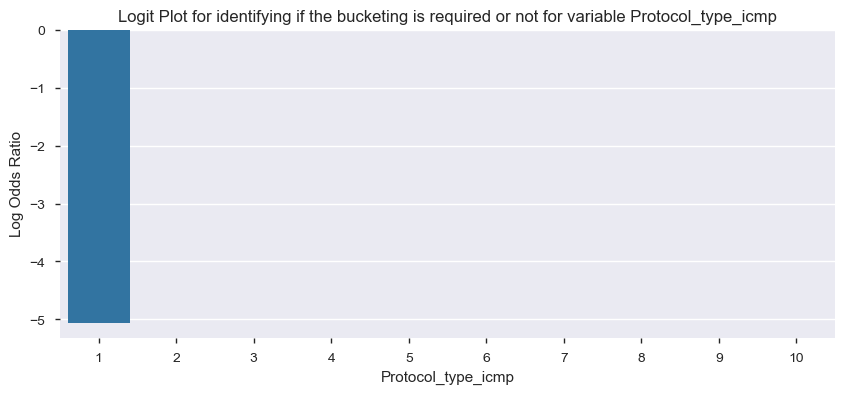

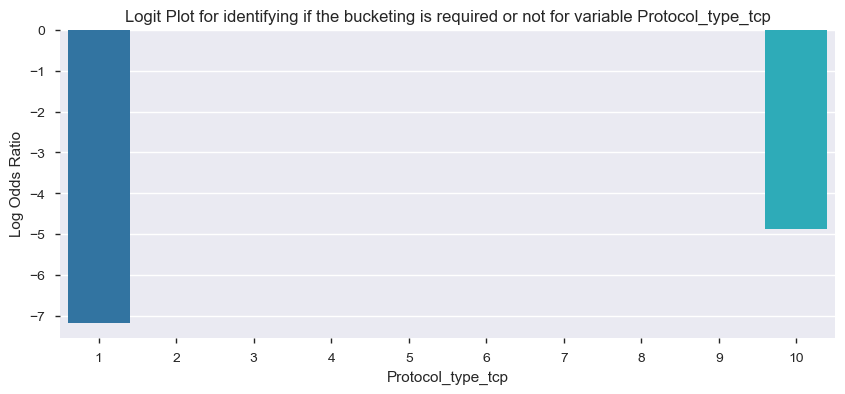

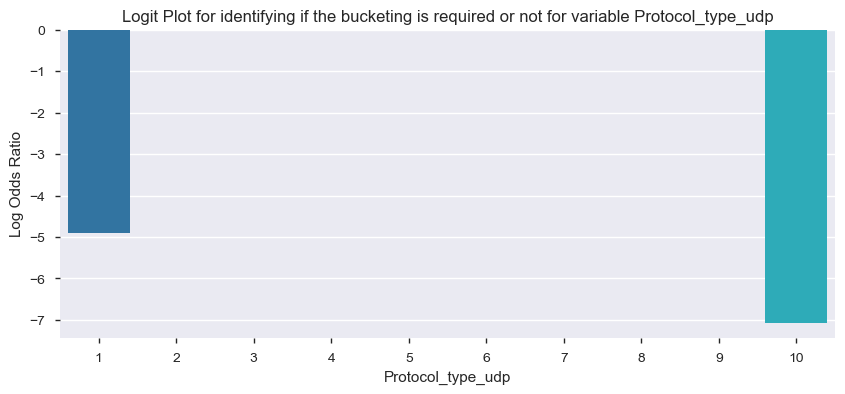

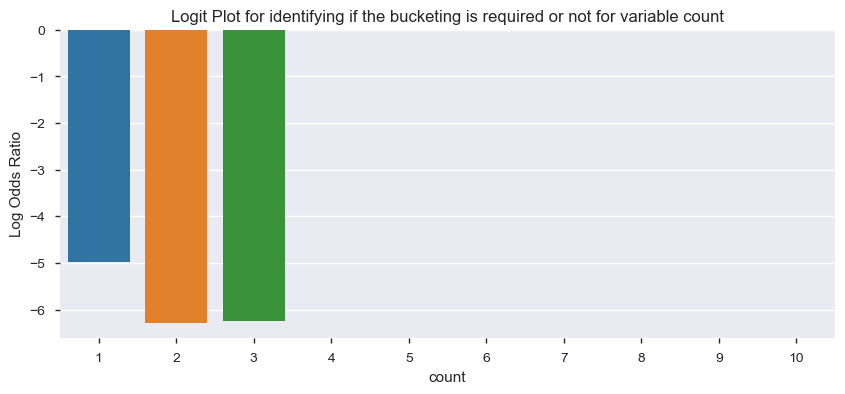

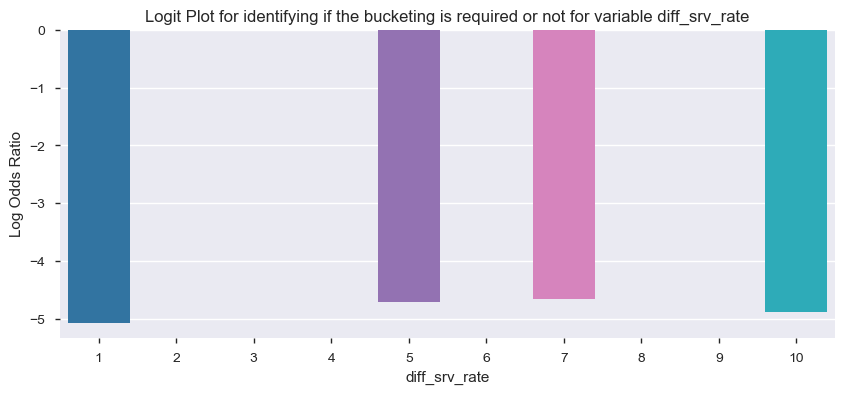

...

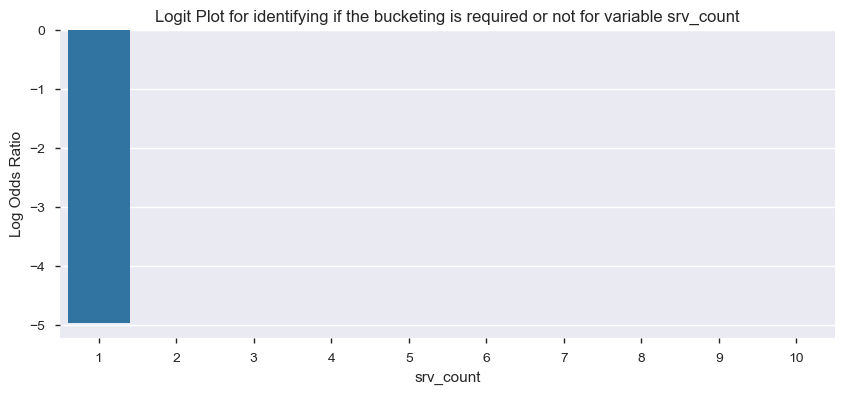

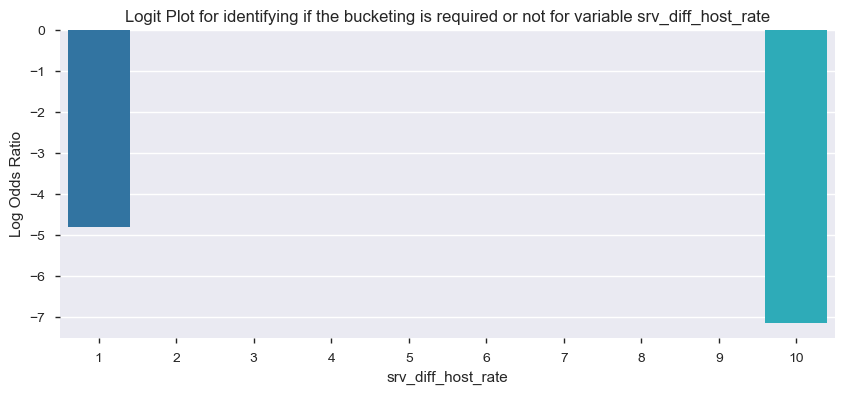

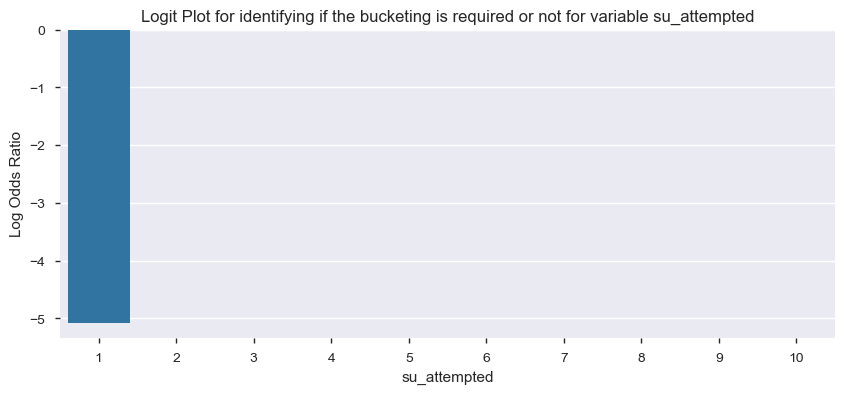

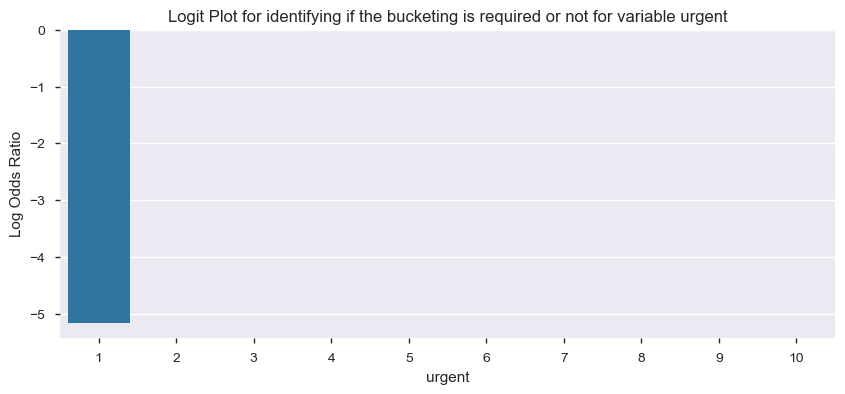

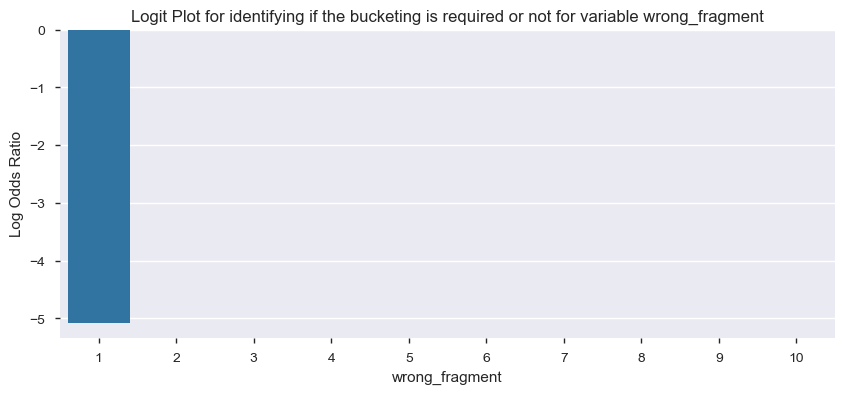

In [254]:
bp = PdfPages('WOE Plots.pdf')

for num_variable in U2R_DataFinal.columns.difference(['label']):
    binned = pd.cut(U2R_DataFinal[num_variable], bins=10, labels=list(range(1,11)))
    #binned = binned.dropna()
    odds = U2R_DataFinal.groupby(binned)['label'].sum() / (U2R_DataFinal.groupby(binned)['label'].count()-U2R_DataFinal.groupby(binned)['label'].sum())
    log_odds = np.log(odds)
    fig,axes = plt.subplots(figsize=(10,4))
    sns.barplot(x=log_odds.index,y=log_odds)
    plt.ylabel('Log Odds Ratio')
    plt.title(str('Logit Plot for identifying if the bucketing is required or not for variable ') + str(num_variable))
    bp.savefig(fig)

bp.close()

#### Varience Inflation Factor

In [255]:
X_new =  X[X.columns.difference(['Protocol_type_icmp','dst_bytes', 'dst_host_rerror_rate','flag_OTH','flag_SH','flag_REJ','flag_RSTO','flag_RSTOS0','flag_RSTR','flag_S0','flag_SF','flag_SH','hot','is_host_login','land','num_access_files','num_outbound_cmds','num_root','num_shells','root_shell','service_Z39_50','service_aol','service_bgp','service_courier','service_csnet_ns','service_ctf','service_daytime','service_discard','service_echo','service_eco_i','service_efs','service_exec','service_gopher','service_harvest','service_hostnames','service_http','service_http_2784','service_http_443','service_http_8001','service_imap4','service_iso_tsap','service_klogin','service_kshell','service_ldap','service_link','service_login','service_mtp','service_name','service_netbios_dgm','service_netbios_ns','service_netbios_ssn','service_netstat','service_nnsp','service_nntp','service_ntp_u','service_pm_dump','service_pop_2','service_pop_3','service_printer','service_private','service_red_i','service_remote_job','service_rje','service_shell','service_sql_net','service_ssh','service_sunrpc','service_supdup','service_systat','service_tftp_u','service_tim_i','service_urh_i','service_uucp','service_uucp_path','service_vmnet','service_whois','src_bytes','su_attempted','urgent','wrong_fragment'])]
#X_new =  X
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(X_new.values, i) for i in range(X_new.shape[1])]
vif["features"] = X_new.columns

print(vif)

    VIF Factor                     features
0     7.791546            Protocol_type_tcp
1     1.839199                        count
2     3.433429               dst_host_count
3     1.793243       dst_host_diff_srv_rate
4     1.949028  dst_host_same_src_port_rate
5    28.367109       dst_host_same_srv_rate
6     1.121241         dst_host_serror_rate
7    25.618875           dst_host_srv_count
8     1.355238  dst_host_srv_diff_host_rate
9     1.340661                     duration
10    1.035329            num_failed_logins
11    1.100625           num_file_creations
12    1.108371                  service_ftp
13    1.577504             service_ftp_data
14    1.306680               service_telnet
15    1.255240           srv_diff_host_rate


#### Splitting the Data into Train & Test

In [256]:
target = U2R_DataFinal[['label']].astype('int64')
features = X_new

In [257]:
#Splitting the data for sklearn methods
train_y, test_y, train_X, test_X = train_test_split(target,features, test_size=0.3, random_state=123)

### Model Building - DOS

### 1. Logistic Regression  - DOS

In [258]:
#Build the model
model = LogisticRegression()
model_Reg = model.fit(train_X, train_y)

In [259]:
train_X['pred_prob'] = pd.DataFrame(model_Reg.predict_proba(train_X), index=train_X.index)[1]
test_X['pred_prob'] = pd.DataFrame(model_Reg.predict_proba(test_X),index=test_X.index)[1]

In [260]:
train = pd.concat([train_X, train_y], axis=1)
test = pd.concat([test_X, test_y], axis=1)

In [262]:
train['pred'] = np.where(train.pred_prob>0.489796, 4,0)
test['pred'] = np.where(test.pred_prob>0.489796, 4,0)

In [263]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(train.label, train.pred)
print(confusion_matrix)

[[53936     3]
 [   80     2]]


In [264]:
print(metrics.classification_report(train.label, train.pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     53939
           4       0.40      0.02      0.05        82

    accuracy                           1.00     54021
   macro avg       0.70      0.51      0.52     54021
weighted avg       1.00      1.00      1.00     54021



In [265]:
print(metrics.classification_report(test.label, test.pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     23115
           4       0.50      0.03      0.05        37

    accuracy                           1.00     23152
   macro avg       0.75      0.51      0.53     23152
weighted avg       1.00      1.00      1.00     23152



In [266]:
## Train predict

pd.crosstab(train.label, train.pred, rownames=['Actual attacks'], colnames=['Predicted attacks'])

Predicted attacks,0,4
Actual attacks,,
0,53936,3
4,80,2


In [267]:
## Train predict

pd.crosstab(test.label, test.pred, rownames=['Actual attacks'], colnames=['Predicted attacks'])

Predicted attacks,0,4
Actual attacks,,
0,23114,1
4,36,1


#### 2. Random Forest Classifier

In [268]:
from sklearn.ensemble import RandomForestClassifier

pargrid_ada = {'n_estimators': [50, 60, 70, 80, 90, 100],
                'max_features': [5,6,7,8,9,10,11,12]}
gscv_Rf = GridSearchCV(estimator=RandomForestClassifier(), 
                        param_grid=pargrid_ada, 
                        cv=5,
                        verbose=True, n_jobs=-1)

In [269]:
gscv_results = gscv_Rf.fit(train_X, train_y)
gscv_results.best_score_

Fitting 5 folds for each of 48 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   45.9s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:  4.4min finished


0.999129967975417

In [270]:
##Train Data

print(metrics.classification_report(train_y,gscv_results.predict(train_X)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     53939
           4       1.00      0.96      0.98        82

    accuracy                           1.00     54021
   macro avg       1.00      0.98      0.99     54021
weighted avg       1.00      1.00      1.00     54021



In [272]:
##Test Data

print(metrics.classification_report(test_y,gscv_results.predict(test_X)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     23115
           4       0.81      0.46      0.59        37

    accuracy                           1.00     23152
   macro avg       0.90      0.73      0.79     23152
weighted avg       1.00      1.00      1.00     23152



In [273]:
## Test Data
pd.crosstab(test_y.label, gscv_results.predict(test_X), rownames=['Actual attacks'], colnames=['Predicted attacks'])

Predicted attacks,0,4
Actual attacks,,
0,23111,4
4,20,17


In [274]:
## Train Data
pd.crosstab(train_y.label, gscv_results.predict(train_X), rownames=['Actual attacks'], colnames=['Predicted attacks'])

Predicted attacks,0,4
Actual attacks,,
0,53939,0
4,3,79


#### 3. XGBoost Classifier

In [275]:
xgb_estimator = XGBClassifier( learning_rate=0.01,
                               n_estimators=1000,
                               max_depth=5,
                               min_child_weight=1,
                               gamma=1,
                               subsample=0.8,
                               colsample_bytree=0.8,
                               n_jobs=-1,
                               reg_alpa=1,
                               scale_pos_weight=1,
                               random_state=42,
                               verbose=1)

In [276]:
xgb_estimator.fit(train_X,train_y)

XGBClassifier(base_score=0.5, booster=None, colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.8, gamma=1, gpu_id=-1,
              importance_type='gain', interaction_constraints=None,
              learning_rate=0.01, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              n_estimators=1000, n_jobs=-1, num_parallel_tree=1,
              objective='binary:logistic', random_state=42, reg_alpa=1,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=0.8,
              tree_method=None, validate_parameters=False, verbose=1,
              verbosity=None)

In [277]:
##Train Data

print(metrics.classification_report(train_y,xgb_estimator.predict(train_X)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     53939
           4       0.98      0.77      0.86        82

    accuracy                           1.00     54021
   macro avg       0.99      0.88      0.93     54021
weighted avg       1.00      1.00      1.00     54021



In [278]:
##Test Data

print(metrics.classification_report(test_y,xgb_estimator.predict(test_X)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     23115
           4       0.80      0.43      0.56        37

    accuracy                           1.00     23152
   macro avg       0.90      0.72      0.78     23152
weighted avg       1.00      1.00      1.00     23152



In [279]:
## Test Data
pd.crosstab(test_y.label, xgb_estimator.predict(test_X), rownames=['Actual attacks'], colnames=['Predicted attacks'])

Predicted attacks,0,4
Actual attacks,,
0,23111,4
4,21,16


In [280]:
## Train Data
pd.crosstab(train_y.label, xgb_estimator.predict(train_X), rownames=['Actual attacks'], colnames=['Predicted attacks'])

Predicted attacks,0,4
Actual attacks,,
0,53938,1
4,19,63


#### 4. Adaptive Boosting

In [281]:
pargrid_ada = {'n_estimators': [100, 200, 400, 600, 800],
               'learning_rate': [10 ** x for x in range(-3, 3)]}

In [282]:
gscv_ada = GridSearchCV(estimator=AdaBoostClassifier(), 
                        param_grid=pargrid_ada, 
                        cv=5,
                        verbose=True, n_jobs=-1)

In [283]:
gscv_ada.fit(train_X, train_y)

Fitting 5 folds for each of 30 candidates, totalling 150 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed: 13.0min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=AdaBoostClassifier(algorithm='SAMME.R',
                                          base_estimator=None,
                                          learning_rate=1.0, n_estimators=50,
                                          random_state=None),
             iid='warn', n_jobs=-1,
             param_grid={'learning_rate': [0.001, 0.01, 0.1, 1, 10, 100],
                         'n_estimators': [100, 200, 400, 600, 800]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=True)

In [284]:
#train Data

print(metrics.classification_report(train_y,gscv_ada.predict(train_X)))

#Test Data

print(metrics.classification_report(test_y,gscv_ada.predict(test_X)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     53939
           4       0.84      0.46      0.60        82

    accuracy                           1.00     54021
   macro avg       0.92      0.73      0.80     54021
weighted avg       1.00      1.00      1.00     54021

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     23115
           4       0.68      0.41      0.51        37

    accuracy                           1.00     23152
   macro avg       0.84      0.70      0.75     23152
weighted avg       1.00      1.00      1.00     23152



In [285]:
## Test Data
pd.crosstab(test_y.label, gscv_results.predict(test_X), rownames=['Actual attacks'], colnames=['Predicted attacks'])

Predicted attacks,0,4
Actual attacks,,
0,23111,4
4,20,17


In [286]:
## Train Data
pd.crosstab(train_y.label, gscv_results.predict(train_X), rownames=['Actual attacks'], colnames=['Predicted attacks'])

Predicted attacks,0,4
Actual attacks,,
0,53939,0
4,3,79
